# Mandelbrot Set

Ever since I was a kid I've been fascinated by fractals. I even remember generating zoomed views of the Mandelbrot set on the [Commodore 64](https://en.wikipedia.org/wiki/Commodore_64)! Lets try to generate the Mandelbrot set from scratch. We'll use this [guide](https://mathworld.wolfram.com/MandelbrotSet.html) from Wolfram as well as [this](https://en.wikipedia.org/wiki/Mandelbrot_set) wikipedia page.

The rules of the game are simple. A point in the imaginary plane is part of the Mandelbrot set if the interation,
$$z_{n+1} \rightarrow z_{n}^2 +C,$$
does <em>NOT</em> not go to infinity with $z_0 = 0$ and $C = x + i y$ is the point under consideration in the imaginary plane.

In practice, 2 is close enough to infinity and the point is colored according to how many iterations it takes for $z_n$ to exceed 2. The standard initial view of the Mandelbrot set is within the range (-2.5,-1) to (1,1).

### Table of Contents
1. [Initial Pass](#Initial-Pass) First attempt at generating the Mandelbrot Set
2. [Complex Mathematics](#Complex-Mathematics) Python's complex format is slow 
3. [Bounding Region](#Bounding-Region) Recognizing large areas within Mandelbrot Set
4. [Save Image](#Save-Image) First attempt at saving the rendering
5. [Tidy Up](#Tidy-Up) Clean up our messy code
6. [Deep Zoom 1](#Deep-Zoom-1) First Deep Zoom with default color map!
7. [Custom Colormap](#Custom-Colormap) Making the image pretty
8. [Matplotlib Colormap](#Matplotlib-Colormap) How does Matplotlib's colormap work?
9. [Cubic Interpolation](#Cubic-Interpolation) How to interpolate between color control points?
10. [Deep Zoom 2](#Deep-Zoom-2) Second deep zoom with custom color map!
11. [Decimal Package](#Decimal-Package) Solving numerical precision problems
12. [Tidy Up Again](#Tidy-Up-Again) Clean up messy code (again)
13. [Deep Zoom 3](#Deep-Zoom-3) Third Deep Zoom with new code!
14. [Automating Inage Generation](#Automating-Image-Generation) Generate the frames for a deep zoom movie
15. [Movie Generation](#Movie-Generation) Use FFmpeg to stitch frames together into an mp4
16. [Julia Sets](#Julia-Sets) Similar to the Mandelbrot set
17. [Wrapping Up](#Wrapping-Up) Final thoughts


## Initial Pass
Lets write a simple program with nested for loops to cycle through the complex plane defined by $-2.5 < x < 1$ on the real axis and $-1 < y < 1$ on the imaginiary axis. We'll start with a step-size of 1000 in the y-direction and scale that to the x-direction using a scale factor defined by:
$$scale\;factor = \frac{x_{max} - x_{min}}{y_{max} - y_{min}}.$$
Our matrix of (x,y) coordinates is the integer values for the column and row; which we need when assigning the value of that matrix element to the number of iterations necessary to exceed $r_{max}$. BUT! The value of $C$ in the iteration formula must be the actual coordinate in the complex plane. Hence, we construct a linear relationship between the index values and the actual values using the slope in the y-direction and in the x-direction. Lastly, we'll display the matrix using the default color map.

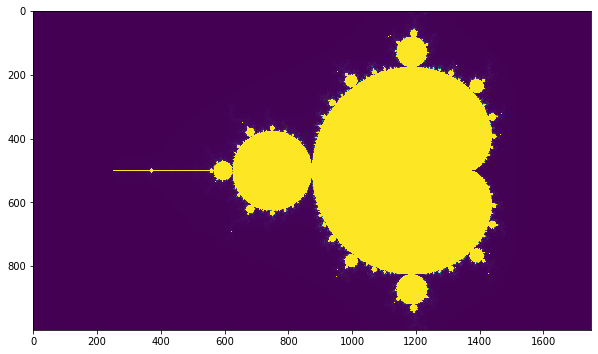

Time to completion (min):  9.51217304468155


In [1]:
# import libraries
import numpy as np
import time
from pylab import *
%matplotlib inline

start_time = time.time()

# initial viewing window
x_min = -2.5
x_max = 1.0
y_min = -1.0
y_max = 1.0

max_iteration = 1000
r_max = 2

N_grid = 1000
scale_factor = (x_max - x_min) / (y_max - y_min)
y_slope  = (y_max - y_min)/N_grid
x_slope  = (x_max - x_min)/(scale_factor*N_grid)

x_range = np.arange(int(scale_factor*N_grid))
y_range = np.arange(N_grid)

Mset = np.zeros((N_grid,int(scale_factor*N_grid))) # np.zeros((num of rows, num of columns))

for y in y_range:
    y_value = y_min + y_slope*y
    for x in x_range:
        x_value = x_min + x_slope*x
        n = 0
        z0 = 0
        C = np.complex(x_value,y_value)
        z = z0**2 + C
        z_test = np.abs(z)
        while z_test <= r_max and n <= max_iteration:
            z = z**2 + C
            z_test = np.abs(z)
            n = n + 1
        # update value in Mset
        Mset[y,x] = n

rcParams['figure.figsize'] = 10, 20
imshow(Mset) # make the plot
show()
end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

Well now, isn't that pretty? We are using the default [viridis](https://matplotlib.org/examples/color/colormaps_reference.html) colormap which will scale the maximum and minimum values in our set to zero (purple) or one (yellow). The value at the (x,y) location in the set is how many iterations it takes for $|z|>2$ with a maximum iteration of 1000. What *are* the maximum and minimum values in our set?

In [2]:
print("The minimum value = ", np.amin(Mset))
print("The maximum value = ", np.amax(Mset))

The minimum value =  0.0
The maximum value =  1001.0


This is a fairly large range of values so we need to consider a way to flatten the range. There are [many ways](http://www.stefanbion.de/fraktal-generator/colormapping/index.htm) to do this but a simple logarithm is a good first try. Lets take the natural log of the number of iterations and then assign that as the value in the matrix:

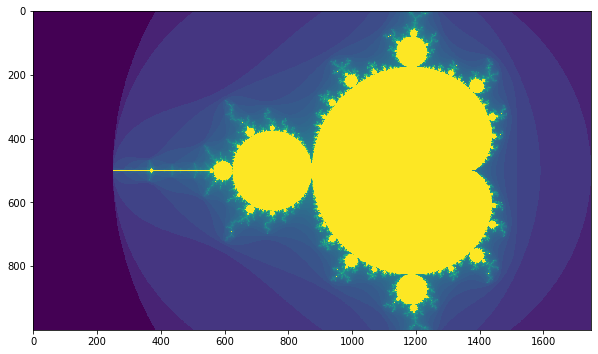

Time to completion (min):  9.486234176158906


In [3]:
# import libraries
import numpy as np
import time
from pylab import *
%matplotlib inline

start_time = time.time()

# initial viewing window
x_min = -2.5
x_max = 1.0
y_min = -1.0
y_max = 1.0

max_iteration = 1000
r_max = 2

N_grid = 1000
scale_factor = (x_max - x_min) / (y_max - y_min)
y_slope  = (y_max - y_min)/N_grid
x_slope  = (x_max - x_min)/(scale_factor*N_grid)

x_range = np.arange(int(scale_factor*N_grid))
y_range = np.arange(N_grid)

Mset = np.zeros((N_grid,int(scale_factor*N_grid))) # np.zeros((num of rows, num of columns))

for y in y_range:
    y_value = y_min + y_slope*y
    for x in x_range:
        x_value = x_min + x_slope*x
        n = 0
        z0 = 0
        C = np.complex(x_value,y_value)
        z = z0**2 + C
        z_test = np.abs(z)
        while z_test <= r_max and n <= max_iteration:
            z = z**2 + C
            z_test = np.abs(z)
            n = n + 1
        # update value in Mset
        Mset[y,x] = np.log(n+1)

rcParams['figure.figsize'] = 10, 20
imshow(Mset) # make the plot
show()
end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

Ah! Much nicer! It is taking about 10 minutes to calculate all the points in the Mandelbrot set at this resolution. We should try to speed this up if we want higher resolution for making a zoom-in or saving images. Two options come to mind:
1. We are asking Python to compute a magnitude of a complex numer which involves a complex square root. We could instead look at the magnitude squared and compare to $r_{max}^2$. That could speed things up.
2. The big yellow regions are all inside the Mandelbrot set. Our code requires us to go through 1000 full iterations for these regions. A purist would insist that each point must be evaluated on its own but we can make use of previous work. For example, [Wolfram](https://mathworld.wolfram.com/MandelbrotSet.html) suggests the kidney bean shape and the circle to the left can be parameterized.

### Complex Mathematics
Recall that $z_{n+1} = z_n + C$, with $C=x+i y$. Python lets us write complex numbers and can easily extract the real and imaginary parts:

In [4]:
z_test = complex(2,3)
print("The real part is = ", z_test.real)
print("The imaginary part is = ", z_test.imag)

The real part is =  2.0
The imaginary part is =  3.0


Let's modify our code to take advantage of this and to eliminate the complex square root.

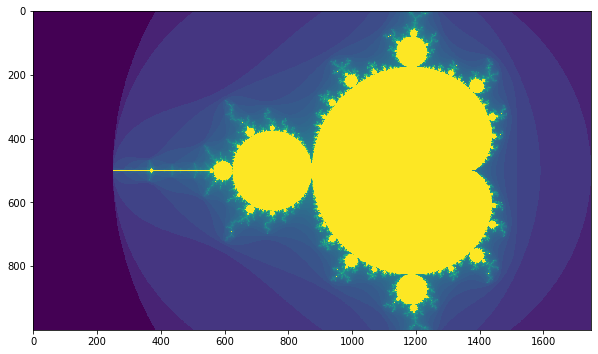

Time to completion (min):  5.101968948046366


In [5]:
# import libraries
import numpy as np
import time
from pylab import *
%matplotlib inline

start_time = time.time()

# initial viewing window
x_min = -2.5
x_max = 1.0
y_min = -1.0
y_max = 1.0

max_iteration = 1000
r_max = 2
r_max_squared = r_max**2

N_grid = 1000
scale_factor = (x_max - x_min) / (y_max - y_min)
y_slope  = (y_max - y_min)/N_grid
x_slope  = (x_max - x_min)/(scale_factor*N_grid)

x_range = np.arange(int(scale_factor*N_grid))
y_range = np.arange(N_grid)

Mset = np.zeros((N_grid,int(scale_factor*N_grid))) # np.zeros((num of rows, num of columns))

for y in y_range:
    y_value = y_min + y_slope*y
    for x in x_range:
        x_value = x_min + x_slope*x
        n = 0
        z0 = np.complex(0,0)
        C = np.complex(x_value,y_value)
        z = z0**2 + C
        z_test_mag_squared = z.real**2 + z.imag**2
        while z_test_mag_squared <= r_max_squared and n <= max_iteration:
            z = z**2 + C
            z_test_mag_squared = z.real**2 + z.imag**2
            n = n + 1
        # update value in Mset
        Mset[y,x] = np.log(n+1)

rcParams['figure.figsize'] = 10, 20
imshow(Mset) # make the plot
show()
end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

Wow! That cut the time in half. Excellent. Now lets try to eliminate points that fall in the two main yellow sections.

### Bounding Region
[Wolfram](https://mathworld.wolfram.com/MandelbrotSet.html) states that the main [circular](https://mathworld.wolfram.com/Circle.html) region is centered at (-1,0) with a radius of 0.25 and that the kidney bean area is bounded by a [cartoid](https://mathworld.wolfram.com/Cardioid.html). [This](https://math.stackexchange.com/questions/1314739/given-x-y-determine-if-it-is-within-a-specific-cardioid) is very helpful in visualizing what we need to do:
![cardioid](cardioid.png "cardioid and variables")

Our location to be tested is given by $(x_{test},y_{test})$ with a distance from the origin given by $r_{test} = \sqrt{x_{test}^2 + y_{test}^2}$. If $r_{test} \leq r$ then the test point is inside the cardioid defined by the equation $r = a(1-\cos(\theta))$ with $a=0.5$. Trigonometry tells us that $\cos(\theta) = x_{test}/r_{test}$.

Wolfram states that the cardioid for the Mandelbrot set is defined with the following parameteric equations:
$$4 x = 2\cos(t) - \cos(2t)$$
$$4 y = 2\sin(t) - \sin(2t).$$
At $t=0$ we have $x=0.25$ and $y=0$ - this means our cardioid is shifted from the origin by 0.25. This shift can be accounted for in the same way as a circle not centered at the origin.

Lets test it by coloring the region inside the circle and cardioid dark purple for contrast to test if it works correctly.

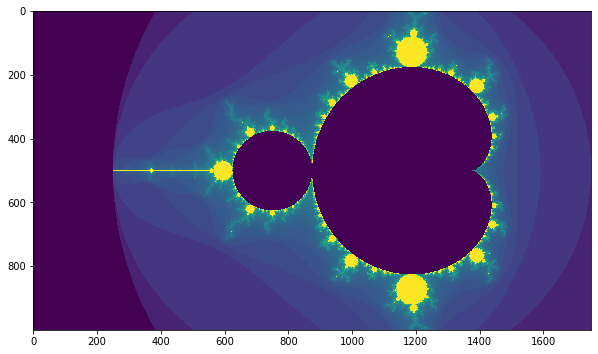

In [6]:
def bounding_region(x,y,x_test,y_test):
    # test circular region
    if ((x_test + 1)**2 + y_test**2) <= 0.25**2:
        # update value in Mset
        Mset[y,x] = 0
        return
    # pesky cardioid origin
    if (x_test - 0.25) == 0 and y_test == 0:
        # update value in Mset
        Mset[y,x] = 0
        return
    # test cardioid region
    else:
        r_test = np.sqrt((x_test-0.25)**2 + y_test**2)
        cos_phi_test = (x_test-0.25) / r_test
        a = 0.5
        if r_test <= a*(1-cos_phi_test):
            Mset[y,x] = 0
            return
        return

for y in y_range:
    y_value = y_min + y_slope*y
    for x in x_range:
        x_value = x_min + x_slope*x
        bounding_region(x,y,x_value,y_value)

rcParams['figure.figsize'] = 10, 20
imshow(Mset) # make the plot
show()

Lovely! Now let's put the pieces together to see how much faster it runs! I've also added a command called [extent](https://stackoverflow.com/questions/6999621/how-to-use-extent-in-matplotlib-pyplot-imshow) to the plotting routine, imshow(). This lets us superimpose our actual complex map on top of the row and column numbers that were displayed before (spoiler alert: I change this latter for reasons). Also, we can set the location of the origin of the rows and columns being displayed. This is in the upper left corner by default but it matches our complex plane if we put it in the lower right. I also modified the code to include a fractical function for ease of changing the Mandelbrot iterative equation later (again - this gets changed later).

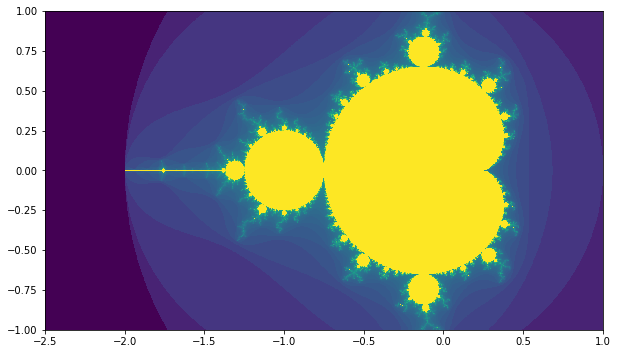

Time to completion (min):  0.7754750490188599


In [7]:
# import libraries
import numpy as np
import time
from pylab import *
%matplotlib inline

start_time = time.time()

# initial viewing window
x_min = -2.5
x_max = 1.0
y_min = -1.0
y_max = 1.0

max_iteration = 1000
r_max = 2
r_max_squared = r_max**2

N_grid = 1000
scale_factor = (x_max - x_min) / (y_max - y_min)
y_slope  = (y_max - y_min)/N_grid
x_slope  = (x_max - x_min)/(scale_factor*N_grid)

x_range = np.arange(int(scale_factor*N_grid))
y_range = np.arange(N_grid)

Mset = np.zeros((N_grid,int(scale_factor*N_grid))) # np.zeros((num of rows, num of columns))

def bounding_region(x,y,x_test,y_test):
    # test circular region
    if ((x_test + 1)**2 + y_test**2) <= 0.25**2:
        return True
    # pesky origin
    if (x_test - 0.25) == 0 and y_test == 0:
        return True
    # test cardtoid region
    else:
        r_test = np.sqrt((x_test-0.25)**2 + y_test**2)
        cos_phi_test = (x_test-0.25) / r_test
        a = 0.5
        if r_test <= a*(1-cos_phi_test):
            return True
        return False

for y in y_range:
    y_value = y_min + y_slope*y
    for x in x_range:
        x_value = x_min + x_slope*x
        # test if point inside know region
        if bounding_region(x,y,x_value,y_value) == True:
            Mset[y,x] = np.log(1001)
        else:
            # test 
            n = 0
            z0 = np.complex(0,0)
            C = np.complex(x_value,y_value)
            z = z0**2 + C
            z_test_mag_squared = z.real**2 + z.imag**2
            while z_test_mag_squared <= r_max_squared and n <= max_iteration:
                z = z**2 + C
                z_test_mag_squared = z.real**2 + z.imag**2
                n = n + 1
            # update value in Mset
            Mset[y,x] = np.log(n+1)

rcParams['figure.figsize'] = 10, 20
# extent=[horizontal_min,horizontal_max,vertical_min,vertical_max].
imshow(Mset,cmap='viridis', interpolation='none', extent=[x_min,x_max,y_min,y_max], origin='lower') # make the plot
show()
end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

Remarkable speed up in the time to render the Mandelbrot set! Excellent! That is beautiful so lets learn how to save the image to a file.

### Save Image
We now have the ability to render fairly high resolution images quickly so being able to save these images for later examination or appreciation or inclusion in a zoom-in video would be a good idea. [This](https://stackoverflow.com/questions/8218608/scipy-savefig-without-frames-axes-only-content) post explains how to do it with the code below: 

In [8]:
import matplotlib.pyplot as plt
fig = plt.figure(frameon=False) # creates a plot environment
h = 12 # inches
w = h*scale_factor
fig.set_size_inches(w,h)
ax = plt.Axes(fig, [0., 0., 1., 1.])
ax.set_axis_off()
fig.add_axes(ax)
# extent=[horizontal_min,horizontal_max,vertical_min,vertical_max].
ax.imshow(Mset,cmap='viridis', interpolation='none', extent=[x_min,x_max,y_min,y_max], origin='lower') # make the plot
fig.savefig('Mset_test.png')
plt.close()

## Tidy Up

To tidy up the code and to make it easy to try new things lets define some fuctions that would allow for ease of modifying parameters in the future:

In [122]:
def scaling_function(n):
    return np.log(n+1)

def fractal_function(z,n_power,C):
    return z**n_power + C

def bounding_region(x,y,x_test,y_test):
    # test circular region
    if ((x_test + 1)**2 + y_test**2) <= 0.25**2:
        return True
    # pesky origin
    if (x_test - 0.25) == 0 and y_test == 0:
        return True
    # test cardtoid region
    else:
        r_test = np.sqrt((x_test-0.25)**2 + y_test**2)
        cos_phi_test = (x_test-0.25) / r_test
        a = 0.5
        if r_test <= a*(1-cos_phi_test):
            return True
        return False

def generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max,n_power):
    r_max_squared = r_max**2
    scale_factor = (x_max - x_min) / (y_max - y_min)
    y_slope  = (y_max - y_min)/N_grid
    x_slope  = (x_max - x_min)/(scale_factor*N_grid)

    x_range = np.arange(int(scale_factor*N_grid))
    y_range = np.arange(N_grid)

    Mset = np.zeros((N_grid,int(scale_factor*N_grid))) # np.zeros((num of rows, num of columns))

    for y in y_range:
        y_value = y_min + y_slope*y
        for x in x_range:
            x_value = x_min + x_slope*x
            if n_power == 2 and bounding_region(x,y,x_value,y_value) == True:
                # test if point inside know region for traditional Mandelbrot Set
                Mset[y,x] = scaling_function(max_iteration+1)
            else:
                # test 
                n = 0
                z0 = np.complex(0,0)
                C = np.complex(x_value,y_value)
                z = fractal_function(z0,n_power,C)
                z_test_mag_squared = z.real**2 + z.imag**2
                while z_test_mag_squared <= r_max_squared and n <= max_iteration:
                    z = fractal_function(z,n_power,C)
                    z_test_mag_squared = z.real**2 + z.imag**2
                    n = n + 1
                # update value in Mset
                Mset[y,x] = scaling_function(n)
    return Mset

def save_image(filename,x_min,x_max,y_min,y_max,N_grid,Mset):
    filename_str = str(filename)+'.png'
    scale_factor = (x_max - x_min) / (y_max - y_min)
    fig = plt.figure(frameon=False) # creates a plot environment
    h = 12 # inches
    w = h*scale_factor
    fig.set_size_inches(w,h)
    my_dpi = N_grid / h
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    # extent=[horizontal_min,horizontal_max,vertical_min,vertical_max].
    ax.imshow(Mset,cmap='viridis', interpolation='none', extent=[x_min,x_max,y_min,y_max], origin='lower') # make the plot
    fig.savefig(filename_str, dpi = 1000)
    plt.close()
    return

# Deep Zoom 1

We can use these functions to generate and display the Mandelbrot set as well as save the image. Note: our viewing window enables us to zoom-in to a region if we like. To facilitate exploring the Mandelbrot set with our code it would be helpful to overlay gridlines on the displayed image. [This](https://stackoverflow.com/questions/38973868/adjusting-gridlines-and-ticks-in-matplotlib-imshow) example is helpful in setting that up. Lets try this and see how it works

In [11]:
def show_image(x_min,x_max,y_min,y_max,N_grid,Mset,zoom_factor):
    scale_factor = (x_max - x_min) / (y_max - y_min)
    h = zoom_factor # inches
    w = h*scale_factor
    rcParams['figure.figsize'] = h, w
    
    plt.figure()
    im = plt.imshow(Mset,cmap='viridis', interpolation='none', extent=[x_min,x_max,y_min,y_max], origin='lower');
    ax = plt.gca();

    num_steps_y = 9
    num_steps_x = int(scale_factor*num_steps_y)

    # Major ticks
    ax.set_xticks(np.linspace(x_min, x_max, num_steps_x));
    ax.set_yticks(np.linspace(y_min, y_max, num_steps_y));

    # Labels for major ticks
    ax.set_xticklabels(np.round(np.linspace(x_min, x_max, num_steps_x),10));
    ax.set_yticklabels(np.round(np.linspace(y_min, y_max, num_steps_y),10));

    # Gridlines based on minor ticks
    ax.grid(which='major', color='w', linestyle='-', linewidth=1)
    show()
    return

Now, run the standard view again:

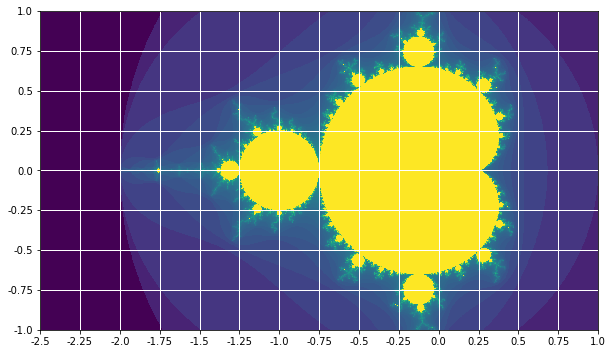

Time to completion (min):  1.3117938041687012


In [13]:
# import libraries
import numpy as np
import time
import matplotlib.pyplot as plt
from pylab import *
%matplotlib inline

start_time = time.time()

# viewing window
x_min = -2.5
x_max = 1.0
y_min = -1.0
y_max = 1.0
zoom_factor = 10

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
n_power = 2

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max,n_power)

save_image('test_1',x_min,x_max,y_min,y_max,N_grid,Mset) # image saved as png

show_image(x_min,x_max,y_min,y_max,N_grid,Mset,zoom_factor)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

Now that is just lovely! We can easily select new minimum and maximum values in the x and y-direction to zoom-in to that region. For example:

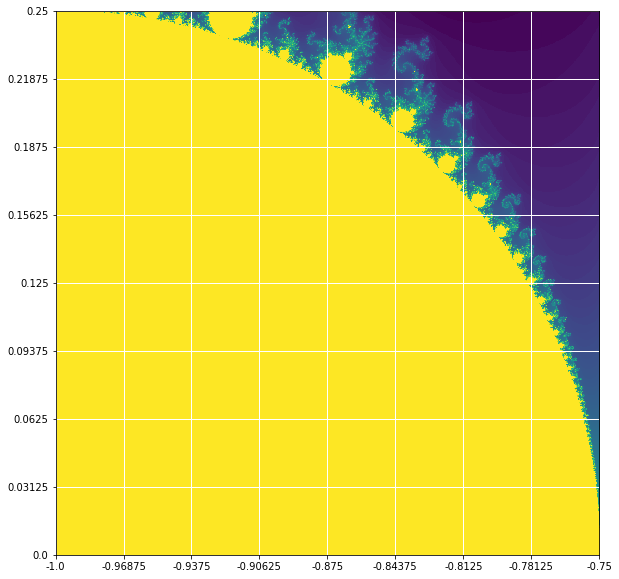

Time to completion (min):  0.599993375937144


In [15]:
# import libraries
import numpy as np
import time
import matplotlib.pyplot as plt
from pylab import *
%matplotlib inline

start_time = time.time()

# viewing window
x_min = -1.0
x_max = -0.75
y_min = 0.0
y_max = 0.25
zoom_factor = 10

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
n_power = 2

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max,n_power)

save_image('test_2',x_min,x_max,y_min,y_max,N_grid,Mset,) # image saved as png

show_image(x_min,x_max,y_min,y_max,N_grid,Mset,zoom_factor)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

And further...

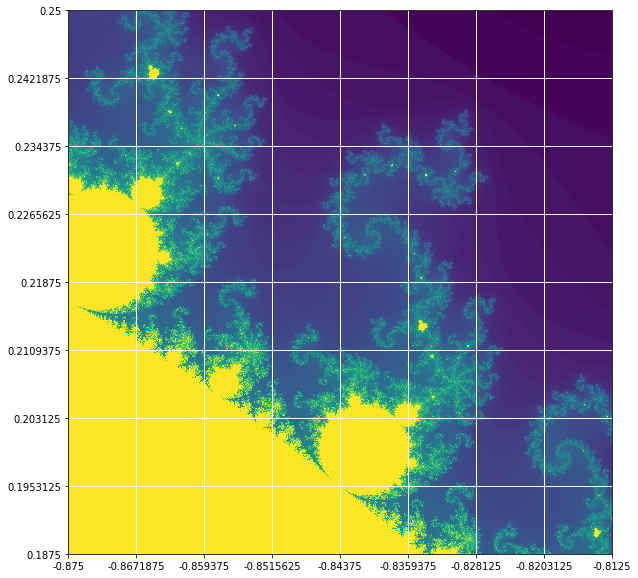

Time to completion (min):  1.5271669308344522


In [16]:
# import libraries
import numpy as np
import time
import matplotlib.pyplot as plt
from pylab import *
%matplotlib inline

start_time = time.time()

# viewing window
x_min = -0.875
x_max = -0.8125
y_min = 0.1875
y_max = 0.25
zoom_factor = 10

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
n_power = 2

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max,n_power)

save_image('test_3',x_min,x_max,y_min,y_max,N_grid,Mset) # image saved as png

show_image(x_min,x_max,y_min,y_max,N_grid,Mset,zoom_factor)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

... and further....

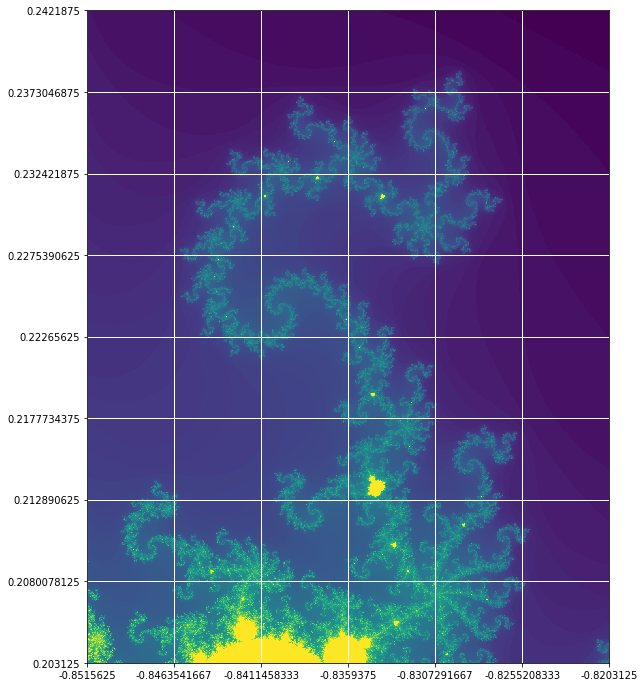

Time to completion (min):  0.7453737537066142


In [17]:
# import libraries
import numpy as np
import time
import matplotlib.pyplot as plt
from pylab import *
%matplotlib inline

start_time = time.time()

# viewing window
x_min = -0.8515625
x_max = -0.8203125
y_min = 0.203125
y_max = 0.2421875
zoom_factor = 15

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
n_power = 2

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max,n_power)

save_image('test_4',x_min,x_max,y_min,y_max,N_grid,Mset) # image saved as png

show_image(x_min,x_max,y_min,y_max,N_grid,Mset,zoom_factor)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

Obviously we could keep going but when we look at fractals online the color maps are very dramatic. The viridis color map is smooth but we need something that is more granular. [This](https://stackoverflow.com/questions/16500656/which-color-gradient-is-used-to-color-mandelbrot-in-wikipedia) is helpful to understand what to do. Also, as we zoom in the axis labels get longer and longer making it more difficult to transcribe the values for the next zoom. Lets modify the show image function to print the x and y-axis tick labels to make it easy to copy and paste the values we want.

## Custom Colormap
As mentioned in the link above a popular fractal generating progam, [Ultra Fractal](https://www.ultrafractal.com/), uses a colormap defined by five RGB color control points over the range from 0 to 1. The trick (apparently) is that a cubic interpolation is used between the control points rather than a linear interpolation. So, there are two things to figure out (1) how to make custom colormaps in matplotlib and (2) how to do cubic interpolation.

### Matplotlib Colormap
[This](https://matplotlib.org/3.1.1/tutorials/colors/colormap-manipulation.html) is a very detailed tutorial on custom colormaps in matplotlib which we use for plotting in Python. Lets regenerate the standard inital view of the Mandelbrot set to use for playing with colormaps.

In [123]:
# import libraries
import numpy as np
import time
import matplotlib.pyplot as plt
from pylab import *
%matplotlib inline

start_time = time.time()

# viewing window
x_min = -2.5
x_max = 1.0
y_min = -1.0
y_max = 1.0

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
n_power = 2 

Mset_cm = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max,n_power)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

Time to completion (min):  0.7170038660367329


The colormap example linked to above starts with taking the viridis color map and breaking it into 256 levels. A new color map starts with these values spanning a range from 0 to 1 in 256 steps (one color for each step). The example then says that the color pink is defined by the array [R,G,B,A] where R is red, G, is green, B is blue, and A is alpha or opacity. The RGB values go from 0 to 1 in the color map so they are scaled from their traditional [html](https://www.w3schools.com/html/html_colors_rgb.asp) values which range from 0 to 255 for 256 color levels in each basis color. Aside - this means there are $256\times256\times256 = 16,777,216$ possible color combinations! Pink is then R=248, G=24, B=148. The example then forces the first 25 levels (of the 256 possible) in the new colormap to be pink. We then feed this through matplotlib's [ListedColormap](https://matplotlib.org/api/_as_gen/matplotlib.colors.ListedColormap.html) function to give our new colormap the attributes matplotlib expects to use when plotting. The followinig code block implements this and replots our standard Mandelbrot set view with the new colormap:

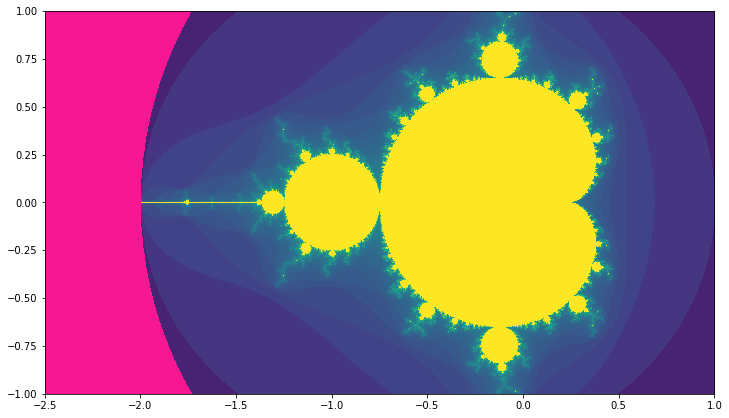

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(0, 1, 256))
pink = np.array([248/256, 24/256, 148/256, 1])
newcolors[:25, :] = pink
newcmp = ListedColormap(newcolors)

imshow(Mset_cm,cmap=newcmp, interpolation='none', extent=[x_min,x_max,y_min,y_max], origin='lower') # make the plot
show()

You can re-run that cell and change it from the first 25 levels to any other value up to 256 to see what happens to the displayed image. The view makes sense since the points farthest away from the Mandelbrot set should diverge very rapidly and so only take a few (if any) iterations to exceed $r_max = 2$.

What if we want to all the levels into something else? In that case we can start with an array of 256 sub arrays with 4 values each: R, G, B, A. We create the array to have the value of one in each slot and then reassign the R, G, & B values in the following way: the red starts at R = 79/256 and goes to 1 in 256 steps, green starts at G = 45/256 and goes to 1 in 256 steps, and lastly, B = 127 / 256 and goes to 1 in 256 steps. Thus, the starting level is a deep purple (actually the official UCA purple color) going up to white as the uppermost color.  

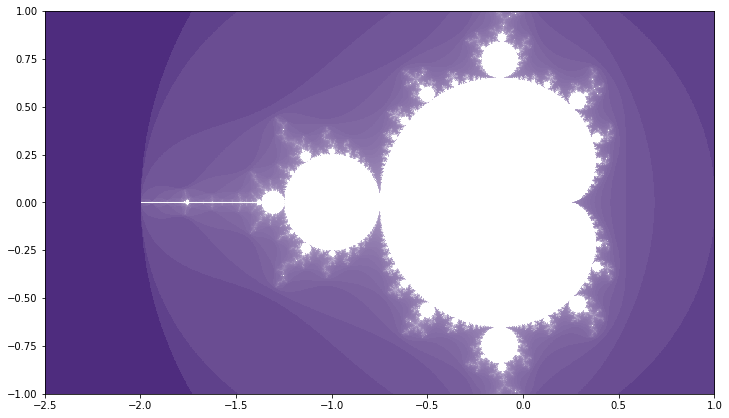

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

N = 256
vals = np.ones((N, 4)) # N levels with 4 values in each level: R,G,B,A
vals[:, 0] = np.linspace(79/256, 1, N) # R
vals[:, 1] = np.linspace(45/256, 1, N) # G
vals[:, 2] = np.linspace(127/256, 1, N) # B
newcmp = ListedColormap(vals)

imshow(Mset_cm,cmap=newcmp, interpolation='none', extent=[x_min,x_max,y_min,y_max], origin='lower') # make the plot
show()

Pretty! So, to make a colormap we just need arrays for our R, G, & B colors.

### Cubic Interpolation
Referring back to the Ultra Fractal colormap link above we are told there is a cubic fit between the control points. We have to be a bit careful because the color map values for the colors can't exceed 255. The python package [scipy](https://docs.scipy.org/doc/scipy/reference/index.html) has an [interpolate](https://docs.scipy.org/doc/scipy/reference/interpolate.html) library which contains various methods of interpolating between points of interest. Lets explore two  interpolation routines: [interp1d](https://docs.scipy.org/doc/scipy/reference/tutorial/interpolate.html) and [pchip_interpolate](https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.pchip_interpolate.html#scipy.interpolate.pchip_interpolate). 

Interp1d has two settings (linear or cubic) while pchip ([Piecewise Cubic Hermite Interpolating Polynomial](https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.PchipInterpolator.html#scipy.interpolate.PchipInterpolator)) uses monotonic cubic splines. Basically, [monotonic](https://en.wikipedia.org/wiki/Monotonic_function) means there are no maximum or minimum between the control points. This difference compared to the cubic fit in the interp1d routine will be important. See the comparison below:

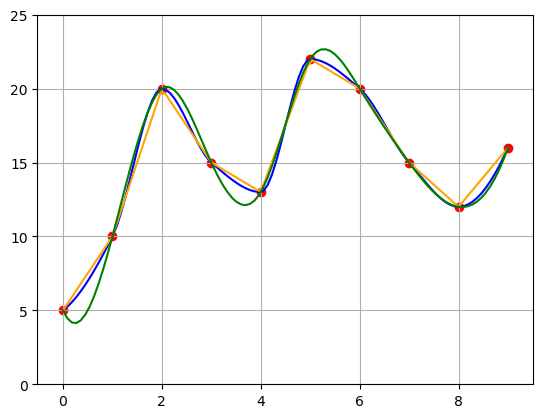

In [25]:
import numpy as np
from scipy.interpolate import interp1d,pchip_interpolate
import matplotlib.pyplot as plt

# Data to be interpolated.
x_data = np.arange(10.0)
y_data = np.array([5.0, 10.0, 20.0, 15.0, 13.0, 22.0, 20.0, 15.0, 12.0, 16.0])

# Dense x for the smooth curve.
x_fit = np.linspace(0, 9.0, 101)

# Create the interpolator.
interp_linear = interp1d(x_data, y_data)
interp_cubic = interp1d(x_data, y_data, kind='cubic')
interp_pchip = pchip_interpolate(x_data, y_data, x_fit)

# Plot it all.
plt.style.use('default') # re-set the scaling
plt.plot(x_fit, interp_pchip, color = 'blue')
plt.plot(x_fit, interp_linear(x_fit), color = 'orange')
plt.plot(x_fit, interp_cubic(x_fit), color = 'green')
plt.scatter(x_data, y_data, color = 'red', marker = 'o')
plt.ylim(0, 25)
plt.grid(True)
plt.show()



The data is in red, the linear interpolation is in orange, the cubic interpolation is in green, and the pchip interpolation is in blue. Notice how the green over shoots (and undershoots) the red points in places? This is problematic if we cannot exceed 255 or go below 0 for RGB color generation. Either the linear or the pchip interpolation would work for this issue. Since the link above for the Ultra Fractal color map says the interpolation is cubic we'll go with the pchip interpolation. Let's take what we have learned and apply it to the Ultra Fractal color control points:

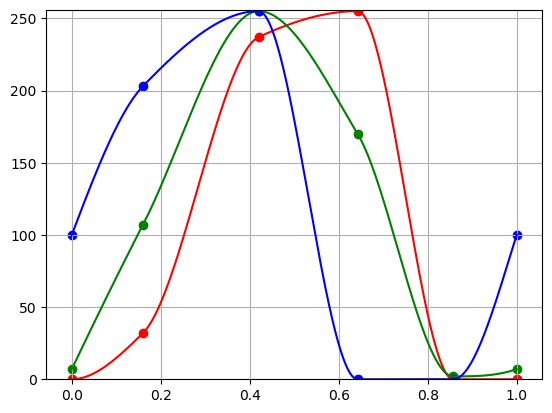

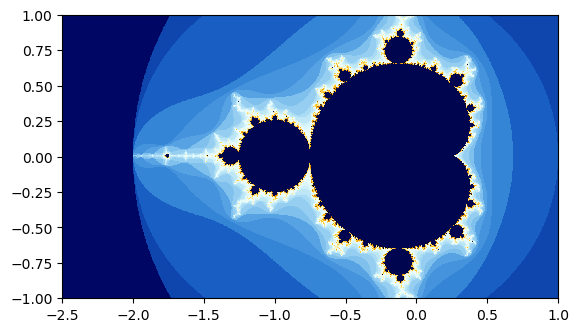

In [26]:
import numpy as np
from scipy.interpolate import pchip
import matplotlib.pyplot as plt

##################
# https://stackoverflow.com/questions/16500656/which-color-gradient-is-used-to-color-mandelbrot-in-wikipedia
# Position = 0.0     Color = (  0,   7, 100)
# Position = 0.16    Color = ( 32, 107, 203)
# Position = 0.42    Color = (237, 255, 255)
# Position = 0.6425  Color = (255, 170,   0)
# Position = 0.8575  Color = (  0,   2,   0)

# Data to be interpolated.
# modified from here: https://stackoverflow.com/questions/12935098/how-to-plot-line-polygonal-chain-with-numpy-scipy-matplotlib-with-minimal-smoo
x_values = np.array([0,0.16,0.42,0.6425,0.8575,1])
R_values = np.array([  0,  32, 237,   255,     0, 0])
G_values = np.array([  7, 107, 255,   170,     2, 7])
B_values = np.array([100, 203, 255,     0,     0, 100])

# Create the interpolator.
interp_R = pchip(x_values, R_values)
interp_G = pchip(x_values, G_values)
interp_B = pchip(x_values, B_values)

# Dense x for the smooth curve.
x_fit = np.linspace(0, 1, 1001)

# Plot it all.
plt.style.use('default') # re-set the scaling
plt.plot(x_fit, interp_R(x_fit),color='red')
plt.scatter(x_values, R_values, color = 'red', marker ='o')
plt.plot(x_fit, interp_G(x_fit),color='green')
plt.scatter(x_values, G_values, color = 'green', marker ='o')
plt.plot(x_fit, interp_B(x_fit),color='blue')
plt.scatter(x_values, B_values, color = 'blue', marker ='o')
plt.ylim(0, 256)
plt.grid(True)
plt.show()

###############
# lets modify the vals and feed it into a new color map

N = 50
vals = np.ones((N, 4)) # (R,G,B, opacity)
for x in range(len(vals)):
        vals[x,0] = interp_R(x/N)/256
        vals[x,1] = interp_G(x/N)/256
        vals[x,2] = interp_B(x/N)/256

fraccmp = ListedColormap(vals)
imshow(Mset_cm,cmap=fraccmp, interpolation='none', extent=[x_min,x_max,y_min,y_max], origin='lower') # make the plot
show()

Lovely! Note that the $N=50$ line in the above code breaks the color map up into 50 levels. This can be larger so the color levels change smoothly or it can be smaller for more dramatic changes. In playing with it and viewing the zooms in the next section I settled on $N=50$ as the most visually pleasing to me.

What would be helpful now is two functions to handle displaying and saving the image. The following code block brings together all that we have done so far to implement these improvements.

In [27]:
def show_image(x_min,x_max,y_min,y_max,N_grid,Mset,zoom_factor):
    x_min = float(x_min)
    x_max = float(x_max)
    y_min = float(y_min)
    y_max = float(y_max)
    #################
    # https://stackoverflow.com/questions/16500656/which-color-gradient-is-used-to-color-mandelbrot-in-wikipedia
    # Position = 0.0     Color = (  0,   7, 100)
    # Position = 0.16    Color = ( 32, 107, 203)
    # Position = 0.42    Color = (237, 255, 255)
    # Position = 0.6425  Color = (255, 170,   0)
    # Position = 0.8575  Color = (  0,   2,   0)
    # Data to be interpolated.
    # modified from here: https://stackoverflow.com/questions/12935098/how-to-plot-line-polygonal-chain-with-numpy-scipy-matplotlib-with-minimal-smoo
    x_values = np.array([0,0.16,0.42,0.6425,0.8575,1])
    R_values = np.array([  0,  32, 237,   255,     0, 0])
    G_values = np.array([  7, 107, 255,   170,     2, 7])
    B_values = np.array([100, 203, 255,     0,     0, 100])
    # Create the interpolator.
    interp_R = pchip(x_values, R_values)
    interp_G = pchip(x_values, G_values)
    interp_B = pchip(x_values, B_values)
    N = 50
    vals = np.ones((N, 4)) # (R,G,B, opacity)
    for x in range(len(vals)):
        vals[x,0] = interp_R(x/N)/256
        vals[x,1] = interp_G(x/N)/256
        vals[x,2] = interp_B(x/N)/256

    fraccmp = ListedColormap(vals)
    ####################
    scale_factor = (x_max - x_min) / (y_max - y_min)
    h = zoom_factor # inches
    w = h*scale_factor
    rcParams['figure.figsize'] = h, w
    
    plt.figure()
    im = plt.imshow(Mset,cmap=ListedColormap(vals), interpolation='none', extent=[x_min,x_max,y_min,y_max], origin='lower');
    ax = plt.gca();

    num_steps_y = 9
    num_steps_x = int(scale_factor*num_steps_y)

    # Major ticks
    ax.set_xticks(np.linspace(x_min, x_max, num_steps_x));
    ax.set_yticks(np.linspace(y_min, y_max, num_steps_y));

    # Labels for major ticks
    np.set_printoptions(precision=30)
    x_tick_labels = np.linspace(x_min, x_max, num_steps_x)
    ax.set_xticklabels(x_tick_labels);
    print('x-tick values: ', x_tick_labels)
    y_tick_labels = np.linspace(y_min, y_max, num_steps_y)
    #y_tick_labels = np.round(np.linspace(y_min, y_max, num_steps_y),15)
    ax.set_yticklabels(y_tick_labels);
    print('y-tick values: ', y_tick_labels)

    # Gridlines based on minor ticks
    ax.grid(which='major', color='w', linestyle='-', linewidth=1)
    show()
    return

def save_image(filename,x_min,x_max,y_min,y_max,N_grid,Mset):
    x_min = float(x_min)
    x_max = float(x_max)
    y_min = float(y_min)
    y_max = float(y_max)
    #################
    # https://stackoverflow.com/questions/16500656/which-color-gradient-is-used-to-color-mandelbrot-in-wikipedia
    # Position = 0.0     Color = (  0,   7, 100)
    # Position = 0.16    Color = ( 32, 107, 203)
    # Position = 0.42    Color = (237, 255, 255)
    # Position = 0.6425  Color = (255, 170,   0)
    # Position = 0.8575  Color = (  0,   2,   0)
    # Data to be interpolated.
    # modified from here: https://stackoverflow.com/questions/12935098/how-to-plot-line-polygonal-chain-with-numpy-scipy-matplotlib-with-minimal-smoo
    x_values = np.array([0,0.16,0.42,0.6425,0.8575,1])
    R_values = np.array([  0,  32, 237,   255,     0, 0])
    G_values = np.array([  7, 107, 255,   170,     2, 7])
    B_values = np.array([100, 203, 255,     0,     0, 100])
    # Create the interpolator.
    interp_R = pchip(x_values, R_values)
    interp_G = pchip(x_values, G_values)
    interp_B = pchip(x_values, B_values)
    N = 50
    vals = np.ones((N, 4)) # (R,G,B, opacity)
    for x in range(len(vals)):
        vals[x,0] = interp_R(x/N)/256
        vals[x,1] = interp_G(x/N)/256
        vals[x,2] = interp_B(x/N)/256

    fraccmp = ListedColormap(vals)
    ####################
    filename_str = str(filename)+'.png'
    scale_factor = (x_max - x_min) / (y_max - y_min)
    fig = plt.figure(frameon=False) # creates a plot environment
    h = 12 # inches
    w = h*scale_factor
    fig.set_size_inches(w,h)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    # extent=[horizontal_min,horizontal_max,vertical_min,vertical_max].
    ax.imshow(Mset,cmap=ListedColormap(vals), interpolation='none', extent=[x_min,x_max,y_min,y_max], origin='lower') # make the plot
    fig.savefig(filename_str,dpi=1000)
    plt.close()
    return

## Deep Zoom 2
What follows is my second attempt at a deep zoom into the Mandelbrot set. The intention was to see how the new color map looked as we zoomed-in and to explore regions for possible animation. There are 22 images the follow. A problem seems to show up at image 21 and is confirmed as a problem in image 22. We'll come to that in time but enjoy the images till then!

The procedure is straightforward - I manually decide upon new values for the minimum and maximum x and y ranges by examining the previously generated image. This code is copied into a new cell and the new ranges altered with the code ran again. I've deleted most of the views due to file size constraints.

x-tick values:  [-2.5  -2.25 -2.   -1.75 -1.5  -1.25 -1.   -0.75 -0.5  -0.25  0.    0.25
  0.5   0.75  1.  ]
y-tick values:  [-1.   -0.75 -0.5  -0.25  0.    0.25  0.5   0.75  1.  ]


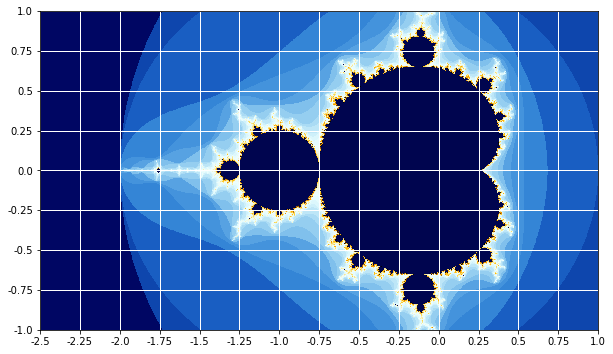

Time to completion (min):  1.185382076104482


In [28]:
# import libraries
import numpy as np
import time
import matplotlib.pyplot as plt
from pylab import *
%matplotlib inline

start_time = time.time()

# viewing window
x_min = -2.5
x_max = 1.0
y_min = -1.0
y_max = 1.0
zoom_factor = 10

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
n_power = 2

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max,n_power)

save_image('test_new_colormap_1',x_min,x_max,y_min,y_max,N_grid,Mset) # image saved as png

show_image(x_min,x_max,y_min,y_max,N_grid,Mset,zoom_factor)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

This view is too pretty to delete!

x-tick values:  [-0.82849052         -0.82849047625      -0.8284904325
 -0.82849038875      -0.8284903450000001 -0.82849030125
 -0.8284902575       -0.82849021375      -0.82849017        ]
y-tick values:  [0.21492605          0.2149260925        0.21492613500000002
 0.2149261775        0.21492622          0.2149262625
 0.21492630499999998 0.2149263475        0.21492639         ]


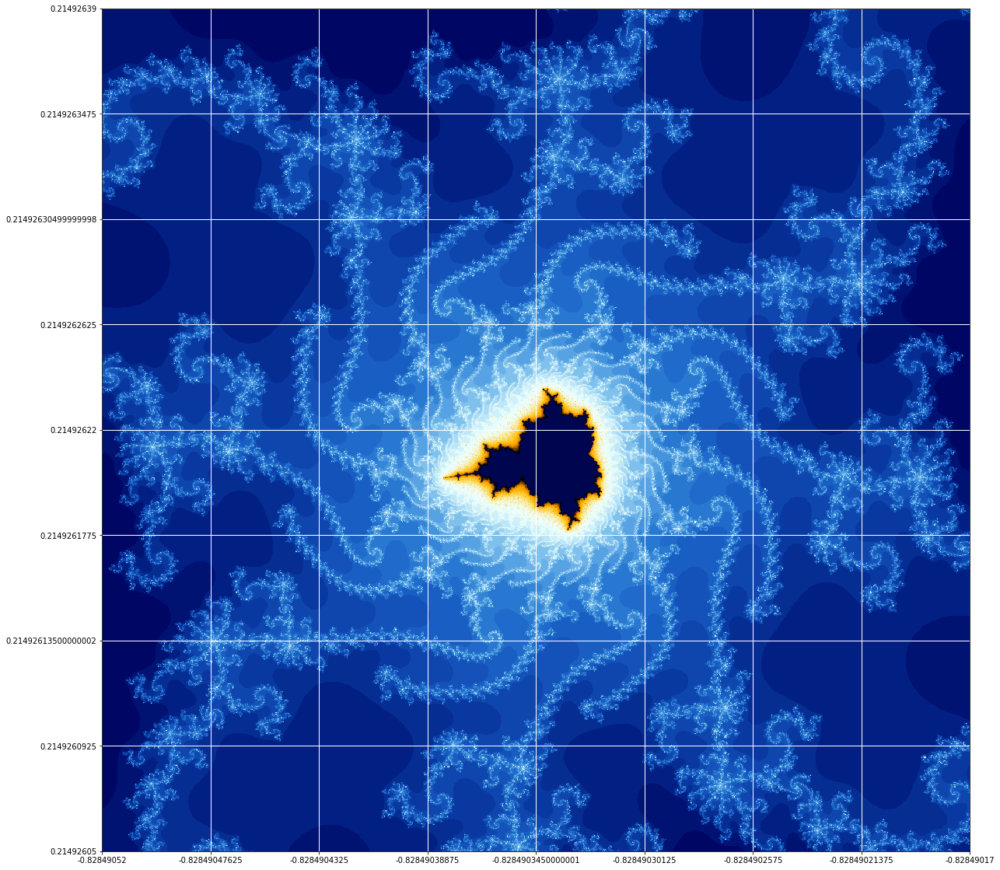

Time to completion (min):  2.4667539318402607


In [38]:
# import libraries
import numpy as np
import time
import matplotlib.pyplot as plt
from pylab import *
%matplotlib inline

start_time = time.time()

# viewing window
x_min = -0.82849052
x_max = -0.82849017
y_min = 0.21492605 
y_max = 0.21492639
zoom_factor = 20

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
n_power = 2

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max,n_power)

save_image('test_new_colormap_11',x_min,x_max,y_min,y_max,N_grid,Mset) # image saved as png

show_image(x_min,x_max,y_min,y_max,N_grid,Mset,zoom_factor)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

I'm keeping the next two views because they start to show a problem that we have to solve.

x-tick values:  [-0.8284903666245734 -0.828490366624569  -0.8284903666245645
 -0.8284903666245601 -0.8284903666245558 -0.8284903666245513
 -0.8284903666245469 -0.8284903666245425 -0.828490366624538 ]
y-tick values:  [0.21492621431932074 0.214926214319325   0.21492621431932923
 0.21492621431933345 0.2149262143193377  0.21492621431934195
 0.21492621431934616 0.2149262143193504  0.21492621431935466]


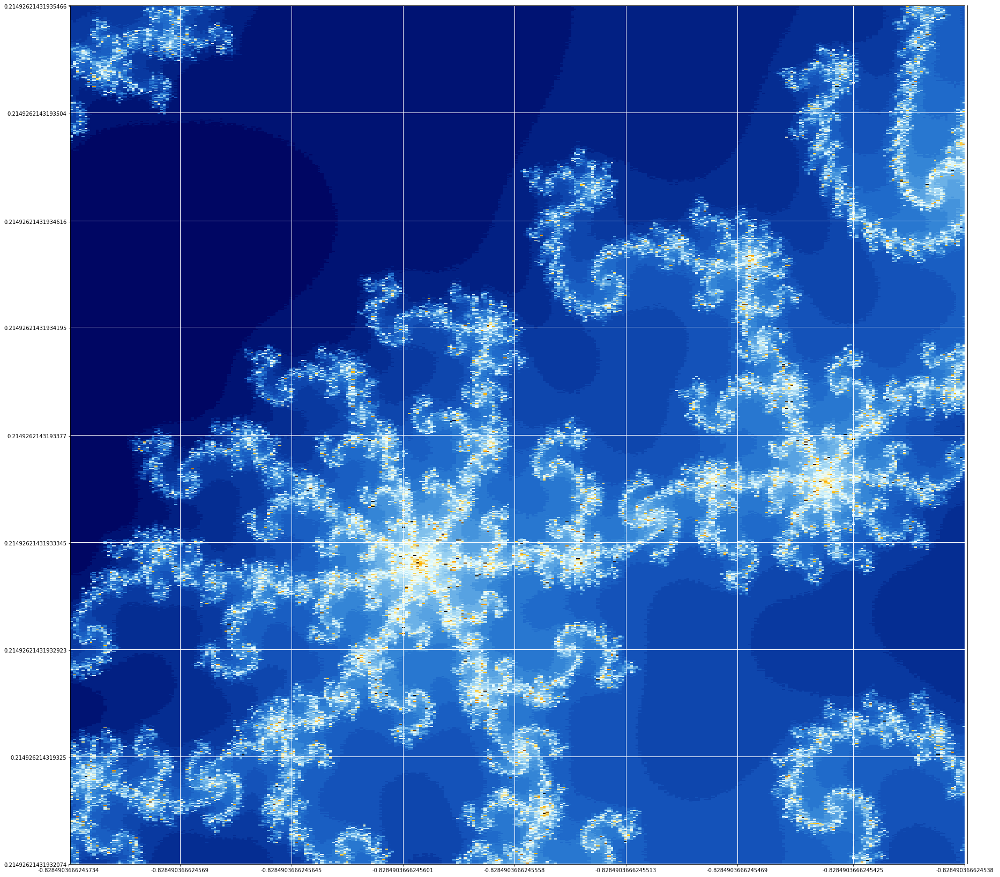

Time to completion (min):  9.125863953431447


In [48]:
# import libraries
import numpy as np
import time
import matplotlib.pyplot as plt
from pylab import *
%matplotlib inline

start_time = time.time()

# viewing window
x_min = -0.8284903666245734
x_max = -0.828490366624538
y_min = 0.21492621431932074
y_max = 0.21492621431935466
zoom_factor = 30

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
n_power = 2

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max,n_power)

save_image('test_new_colormap_21',x_min,x_max,y_min,y_max,N_grid,Mset) # image saved as png

show_image(x_min,x_max,y_min,y_max,N_grid,Mset,zoom_factor)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

x-tick values:  [-0.8284903666245645 -0.8284903666245634 -0.8284903666245623
 -0.8284903666245612 -0.8284903666245602 -0.8284903666245591
 -0.828490366624558  -0.8284903666245569 -0.8284903666245558]
y-tick values:  [0.21492621431932923 0.2149262143193303  0.21492621431933134
 0.2149262143193324  0.21492621431933345 0.21492621431933454
 0.2149262143193356  0.21492621431933664 0.2149262143193377 ]


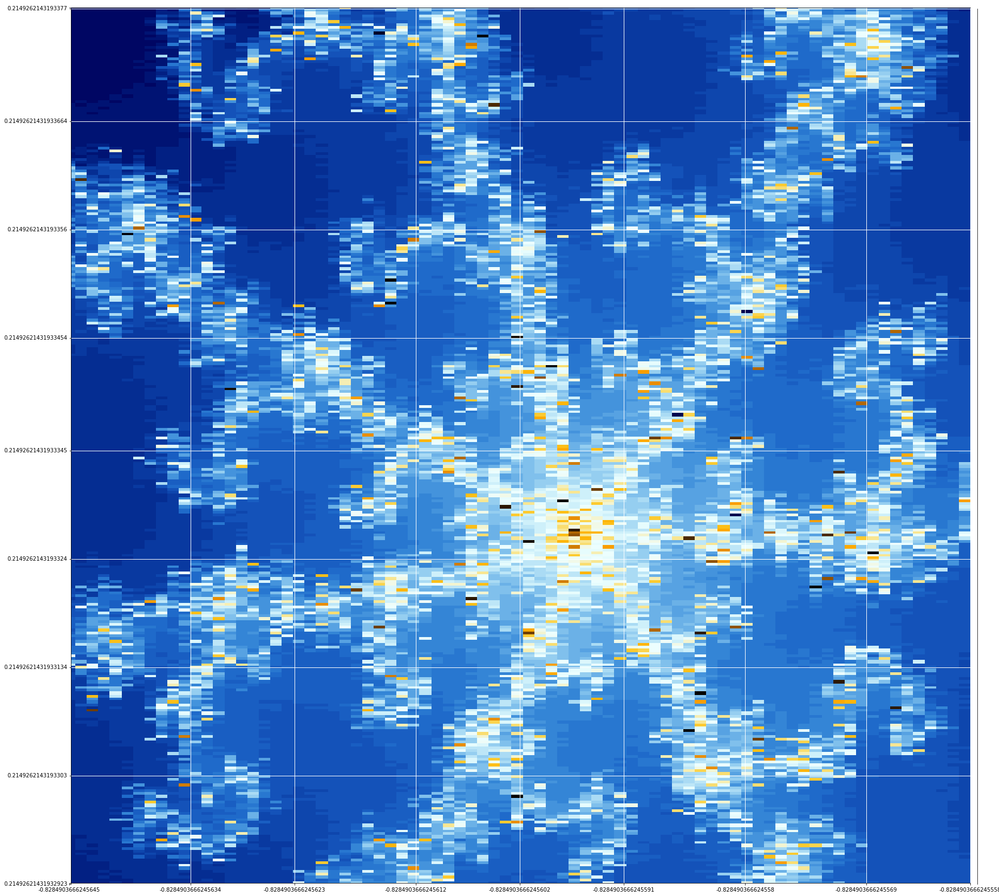

Time to completion (min):  9.43455837170283


In [49]:
# import libraries
import numpy as np
import time
import matplotlib.pyplot as plt
from pylab import *
%matplotlib inline

start_time = time.time()

# viewing window
x_min = -0.8284903666245645
x_max = -0.8284903666245558
y_min = 0.21492621431932923
y_max = 0.2149262143193377
zoom_factor = 30

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
n_power = 2

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max,n_power)

save_image('test_new_colormap_22',x_min,x_max,y_min,y_max,N_grid,Mset) # image saved as png

show_image(x_min,x_max,y_min,y_max,N_grid,Mset,zoom_factor)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

Notice how pixelated the image is? Lets check something. Numpy can handle fairly large numbers but the numerical precision (or resolution) is only $10^{-15}$. That is, 15 decimal places:

In [50]:
np.finfo(np.longdouble)

finfo(resolution=1e-15, min=-1.7976931348623157e+308, max=1.7976931348623157e+308, dtype=float64)

If we look at the number of digits in the last run we see we have 16 digits after the decimal:

In [ ]:
x-tick values:  [-0.8284903666245645 -0.8284903666245634 -0.8284903666245623
 -0.8284903666245612 -0.8284903666245602 -0.8284903666245591
 -0.828490366624558  -0.8284903666245569 -0.8284903666245558]

Interesting. We have bumped into float's numerical precision. We can't zoom further until we solve this issue.

## Decimal Package
There is a package called [decimal](https://docs.python.org/3/library/decimal.html) that may be of some help. The precision can be set by the user with a default of 28:

In [51]:
from decimal import *
getcontext()

Context(prec=28, rounding=ROUND_HALF_EVEN, Emin=-999999, Emax=999999, capitals=1, clamp=0, flags=[], traps=[InvalidOperation, DivisionByZero, Overflow])

Okay. Lets play at bit with mathematical operations to see how the decimal package works:

In [52]:
print(2**0.5) # standard square-root of 2
print(Decimal(2) ** Decimal(0.5)) # decimal square-root of 2

1.4142135623730951
1.414213562373095048801688724


What about raising a complex number to a power?

In [53]:
print(Decimal(complex(2,3)) ** Decimal(2)) # square of complex number

TypeError: conversion from complex to Decimal is not supported

Nope. Try it another way:

In [54]:
print(complex(Decimal(2),Decimal(3)) ** Decimal(2))

TypeError: unsupported operand type(s) for ** or pow(): 'complex' and 'decimal.Decimal'

Nope again. Can decimals go into the complex format and come out as decimals?

In [57]:
print(complex(Decimal(2**0.5),Decimal(3**0.5)))

(1.4142135623730951+1.7320508075688772j)


Nope still only 16 decimal places. So, we can't use complex data type but if we keep the real and imaginary parts separate and combine using rules of algebra when executing the product then that should work. Will need to rewrite the generate_Mset() function. Lets check to be sure this will work:

In [58]:
getcontext().prec = 100 # set precision high

z_n_re = Decimal(0.21845645687879795464565467547) # make up very precise real part
z_n_im = Decimal(0.3345345634575687455756756756768) # make up very precise imaginary part

C_re = Decimal(0.79435934858345) # make up very precise real part
C_im = Decimal(0.665776897806534532534656) # make up very precise imaginary part

# z_(n+1) = z_n + C_n
# using the FOIL method and the rules of complex numbers
z_n_plus_one_re = z_n_re**2 + z_n_im**2 + C_re
z_n_plus_one_im = Decimal(2)*z_n_re*z_n_im + C_im

print(z_n_plus_one_re)
print(z_n_plus_one_re**2)
print(z_n_plus_one_im)
print(complex(z_n_plus_one_re,z_n_plus_one_im))
1.3>z_n_re

0.9539959462832342415674998646996510757437420915599591181624495857347550975546823792683426290750503540
0.9101082655248435525277807481543481359618106076758705100644651015002932630966986673702915505327428372
0.8119393686794062165871999310963145286717047715084532994961461947139996775391068695171270519495010376
(0.9539959462832343+0.8119393686794062j)


True

Great! We can use the decimal package to increase our precision but can't use the complex format. However, we can use the regular rules of multiplying and raising to a power on decimal format numbers. Ok.. lets rework the code to make use of the decimal library:

In [59]:
# import libraries
import numpy as np
from decimal import *
getcontext().prec = 32
import time
import matplotlib.pyplot as plt
from pylab import *
%matplotlib inline

In [60]:
def scaling_function(n):
    return np.log(n+1)

def bounding_region(x,y,x_test,y_test):
    # test circular region
    if ((x_test + 1)**2 + y_test**2) <= 0.25**2:
        return True
    # pesky origin
    if (x_test - Decimal(0.25)) == 0 and y_test == 0:
        return True
    # test cardoid region
    else:
        r_test = np.sqrt((x_test-Decimal(0.25))**2 + y_test**2)
        cos_phi_test = (x_test-Decimal(0.25)) / r_test
        a = Decimal(0.5)
        if r_test <= a*(1-cos_phi_test):
            return True
        return False

def generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max,n_power):
    r_max_squared = r_max**2
    scale_factor = (x_max - x_min) / (y_max - y_min)
    y_slope  = (y_max - y_min)/N_grid
    x_slope  = (x_max - x_min)/(scale_factor*N_grid)

    x_range = np.arange(int(scale_factor*N_grid))
    y_range = np.arange(N_grid)

    Mset = np.zeros((N_grid,int(scale_factor*N_grid))) # np.zeros((num of rows, num of columns))

    for y in y_range:
        y_value = y_min + y_slope*y
        for x in x_range:
            x_value = x_min + x_slope*x
            if n_power == 2 and bounding_region(x,y,x_value,y_value) == True:
                # test if point inside know region for traditional Mandelbrot Set
                Mset[y,x] = scaling_function(max_iteration+1)
            else:
                # test 
                n = 0
                z_0_re = Decimal(0)
                z_0_im = Decimal(0)
                C_re = Decimal(x_value)
                C_im = Decimal(y_value)
                # Mandelbrot generator: z_(n+1) = z_n**2 + C
                z_re = z_0_re**2 - z_0_im**2 + C_re
                z_im = Decimal(2)*z_0_re * z_0_im + C_im
                z_test_mag_squared = z_re**2 + z_im**2
                while z_test_mag_squared <= r_max_squared and n <= max_iteration:
                    # Mandelbrot generator: z_(n+1) = z_n**2 + C
                    z_re_new = z_re**2 - z_im**2 + C_re
                    z_im_new = Decimal(2)*z_re * z_im + C_im
                    z_test_mag_squared = z_re_new**2 + z_im_new**2
                    n = n + 1
                    # old becomes new again
                    z_re = z_re_new
                    z_im = z_im_new
                # update value in Mset
                Mset[y,x] = scaling_function(n)
    return Mset

Lets re-run the last two views. Note: getcontext().prec = 32 was taking hours so I interrupted the code, dropped it to 20, and ran it again.

x-tick values:  [-0.8284903666245734 -0.828490366624569  -0.8284903666245645
 -0.8284903666245601 -0.8284903666245558 -0.8284903666245513
 -0.8284903666245469 -0.8284903666245425 -0.828490366624538 ]
y-tick values:  [0.21492621431932074 0.214926214319325   0.21492621431932923
 0.21492621431933345 0.2149262143193377  0.21492621431934195
 0.21492621431934616 0.2149262143193504  0.21492621431935466]


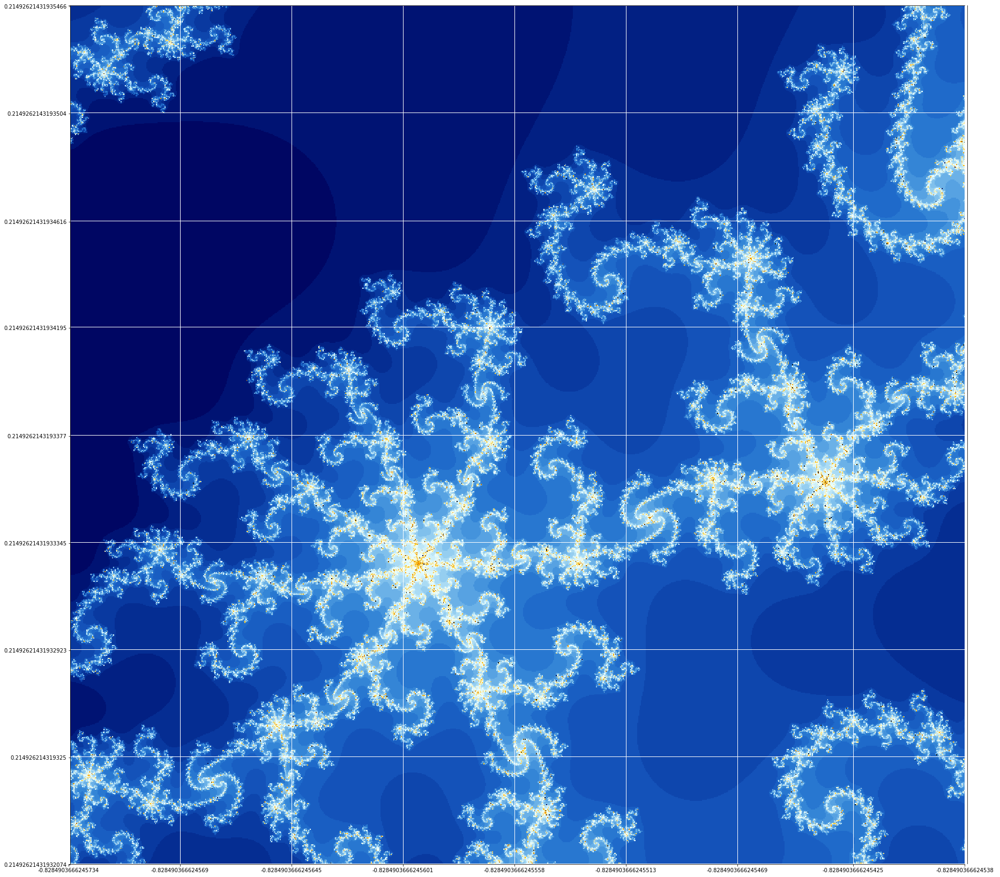

Time to completion (min):  29.523158303896587


In [61]:
# import libraries
import numpy as np
from decimal import *
getcontext().prec = 20
import time
import matplotlib.pyplot as plt
from pylab import *
%matplotlib inline

start_time = time.time()

# viewing window
x_min = Decimal(-0.8284903666245734)
x_max = Decimal(-0.828490366624538)
y_min = Decimal(0.21492621431932074)
y_max = Decimal(0.21492621431935466)
zoom_factor = 30

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
n_power = 2

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max,n_power)

save_image('test_new_colormap_21b',x_min,x_max,y_min,y_max,N_grid,Mset) # image saved as png

show_image(x_min,x_max,y_min,y_max,N_grid,Mset,zoom_factor)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

x-tick values:  [-0.8284903666245645 -0.8284903666245634 -0.8284903666245623
 -0.8284903666245612 -0.8284903666245602 -0.8284903666245591
 -0.828490366624558  -0.8284903666245569 -0.8284903666245558]
y-tick values:  [0.21492621431932923 0.2149262143193303  0.21492621431933134
 0.2149262143193324  0.21492621431933345 0.21492621431933454
 0.2149262143193356  0.21492621431933664 0.2149262143193377 ]


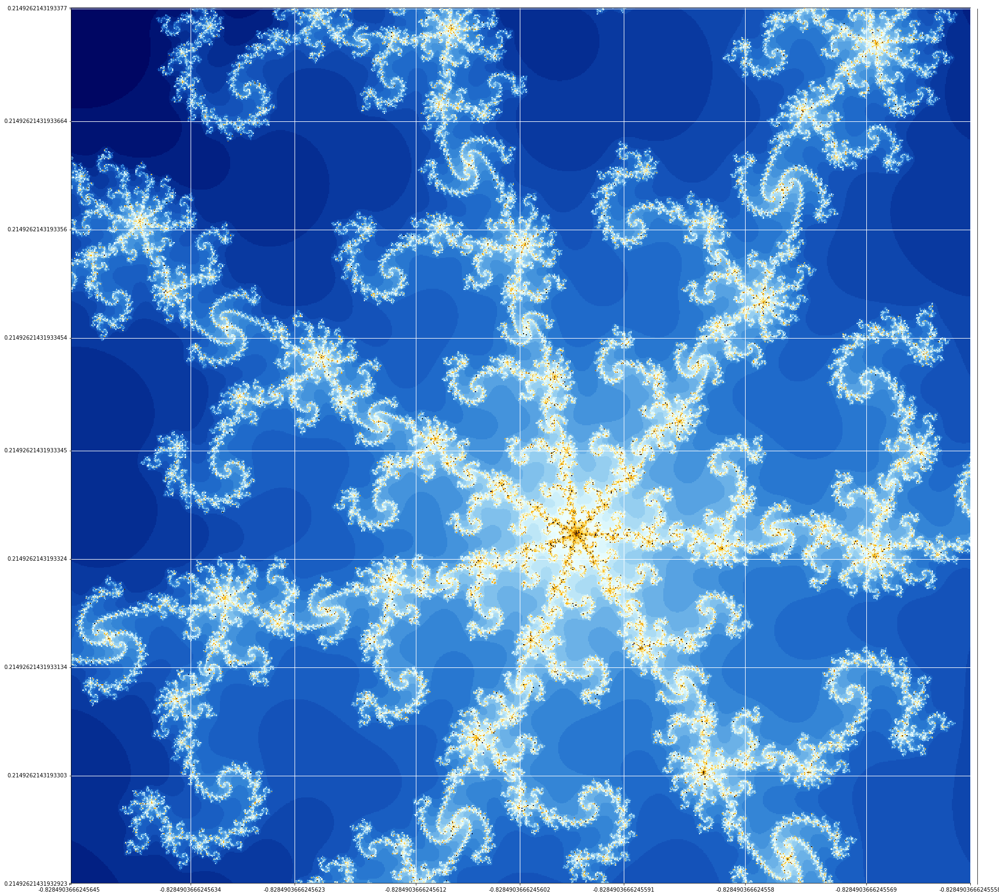

Time to completion (min):  29.419827083746593


In [62]:
# import libraries
import numpy as np
from decimal import *
getcontext().prec = 28
import time
import matplotlib.pyplot as plt
from pylab import *
%matplotlib inline

start_time = time.time()

# viewing window
x_min = Decimal(-0.8284903666245645)
x_max = Decimal(-0.8284903666245558)
y_min = Decimal(0.21492621431932923)
y_max = Decimal(0.2149262143193377)
zoom_factor = 30

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
n_power = 2

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max,n_power)

save_image('test_new_colormap_22b',x_min,x_max,y_min,y_max,N_grid,Mset) # image saved as png

show_image(x_min,x_max,y_min,y_max,N_grid,Mset,zoom_factor)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

Ok! So, the decimal package will allow us to zoom deeper at the cost of time due to keeping track of more digits.

## Tidy Up Again

After all that work to display and use as many digits as possible to allow for selecting regions to zoom into I'm now thinking that what would be easier is to just display the column and row numbers on the image *and* stick with a square view from the start to eliminate the scale_factor and wonkiness. This is with the eventual goal of automating the zoom-in process to generate the frames for a movie. It would also be useful to know the coordinate of the center of the view so that we can use that as a target when automating the process later. To attempt to speed things up I've also given the code the ability to check how many decimal places are being used and to increment the number possible so that we can run as fast as possible but increase precision as needed. I've also tidied up the display and save image functions by putting the color map generator in a separate function. The following cells implement these changes:

In [119]:
# import libraries
import numpy as np
from decimal import *
getcontext().prec = 20
import time
import matplotlib.pyplot as plt
from pylab import *
%matplotlib inline


from scipy.interpolate import pchip
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from scipy.interpolate import interp1d

In [120]:
def scaling_function(n):
    return np.log(n+1)

def bounding_region(x,y,x_test,y_test):
    # test circular region
    if ((x_test + 1)**2 + y_test**2) <= 0.25**2:
        return True
    # pesky origin
    if (x_test - Decimal(0.25)) == 0 and y_test == 0:
        return True
    # test cardoid region
    else:
        r_test = np.sqrt((x_test-Decimal(0.25))**2 + y_test**2)
        cos_phi_test = (x_test-Decimal(0.25)) / r_test
        a = Decimal(0.5)
        if r_test <= a*(1-cos_phi_test):
            return True
        return False

def generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max):
    r_max_squared = r_max**2
    y_slope  = (y_max - y_min)/N_grid
    x_slope  = (x_max - x_min)/N_grid

    x_range = np.arange(N_grid)
    y_range = np.arange(N_grid)
    ###################
    # Coordinate at the center of the view
    x_mid = x_min + x_slope*N_grid/2
    y_mid = y_min + y_slope*N_grid/2
    if y_mid < 0:
        print('The coordinate at the center of the view is: (' + str(x_mid) + ' - ' + str(abs(y_mid)) + 'j)')
    if y_mid > 0:
        print('The coordinate at the center of the view is: (' + str(x_mid) + ' + ' + str(abs(y_mid)) + 'j)')
    ###################
    # check and increment Decimal if necessary
    current_decimal_places = len(str(x_mid).split('.')[1])
    N_decimal_places = getcontext().prec
    if N_decimal_places - current_decimal_places < 3:
        getcontext().prec = N_decimal_places + 1
    ############################
    Mset = np.zeros((N_grid,N_grid)) # np.zeros((num of rows, num of columns))

    for y in y_range:
        y_value = y_min + y_slope*y
        for x in x_range:
            x_value = x_min + x_slope*x
            if bounding_region(x,y,x_value,y_value) == True:
                # test if point inside know region for traditional Mandelbrot Set
                Mset[y,x] = scaling_function(max_iteration+1)
            else:
                # test 
                n = 0
                z_0_re = Decimal(0)
                z_0_im = Decimal(0)
                C_re = Decimal(x_value)
                C_im = Decimal(y_value)
                # Mandelbrot generator: z_(n+1) = z_n**2 + C
                z_re = z_0_re**2 - z_0_im**2 + C_re
                z_im = Decimal(2)*z_0_re * z_0_im + C_im
                z_test_mag_squared = z_re**2 + z_im**2
                while z_test_mag_squared <= r_max_squared and n <= max_iteration:
                    # Mandelbrot generator: z_(n+1) = z_n**2 + C
                    z_re_new = z_re**2 - z_im**2 + C_re
                    z_im_new = Decimal(2)*z_re * z_im + C_im
                    z_test_mag_squared = z_re_new**2 + z_im_new**2
                    n = n + 1
                    # old becomes new again
                    z_re = z_re_new
                    z_im = z_im_new
                # update value in Mset
                Mset[y,x] = scaling_function(n)
    return Mset

In [68]:
def frac_color_map(num_color_levels):
    #################
    # https://stackoverflow.com/questions/16500656/which-color-gradient-is-used-to-color-mandelbrot-in-wikipedia
    # Position = 0.0     Color = (  0,   7, 100)
    # Position = 0.16    Color = ( 32, 107, 203)
    # Position = 0.42    Color = (237, 255, 255)
    # Position = 0.6425  Color = (255, 170,   0)
    # Position = 0.8575  Color = (  0,   2,   0)
    # Data to be interpolated.
    # modified from here: https://stackoverflow.com/questions/12935098/how-to-plot-line-polygonal-chain-with-numpy-scipy-matplotlib-with-minimal-smoo
    x_values = np.array([  0,0.16,0.42,0.6425,0.8575,1])
    R_values = np.array([  0,  32, 237,   255,     0, 0])
    G_values = np.array([  7, 107, 255,   170,     2, 7])
    B_values = np.array([100, 203, 255,     0,     0, 100])
    # Create the interpolator.
    interp_R = pchip(x_values, R_values)
    interp_G = pchip(x_values, G_values)
    interp_B = pchip(x_values, B_values)
    #numlevels = 50
    vals = np.ones((num_color_levels, 4)) # (R,G,B, opacity)
    for x in range(len(vals)):
        vals[x,0] = interp_R(x/num_color_levels)/256
        vals[x,1] = interp_G(x/num_color_levels)/256
        vals[x,2] = interp_B(x/num_color_levels)/256

    return ListedColormap(vals)

def show_image_2(N_grid,Mset,num_color_levels):
    rcParams['figure.figsize'] = 10, 10
    plt.figure()
    im = plt.imshow(Mset,cmap=frac_color_map(num_color_levels), interpolation='none', origin='lower');
    ax = plt.gca();

    num_steps_y = 9
    num_steps_x = 9

    # Major ticks
    ax.set_xticks(np.linspace(0, N_grid, num_steps_x));
    ax.set_yticks(np.linspace(0, N_grid, num_steps_y));

    # Labels for major ticks
    x_tick_labels = np.linspace(0, N_grid, num_steps_x)
    ax.set_xticklabels(x_tick_labels)
    y_tick_labels = np.linspace(0, N_grid, num_steps_y)
    ax.set_yticklabels(y_tick_labels)

    # Gridlines based on major ticks
    ax.grid(which='major', color='w', linestyle='-', linewidth=1)
    show()
    return

def save_image(filename,Mset,num_color_levels):
    filename_str = str(filename)+'.png'
    fig = plt.figure(frameon=False) # creates a plot environment
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    imshow(Mset,cmap=frac_color_map(num_color_levels), interpolation='none', origin='lower') # make the plot
    fig.savefig(filename_str)
    plt.close()
    return

## Deep Zoom 3

Let's run our standard view but this time with a square view to see if our new code works:

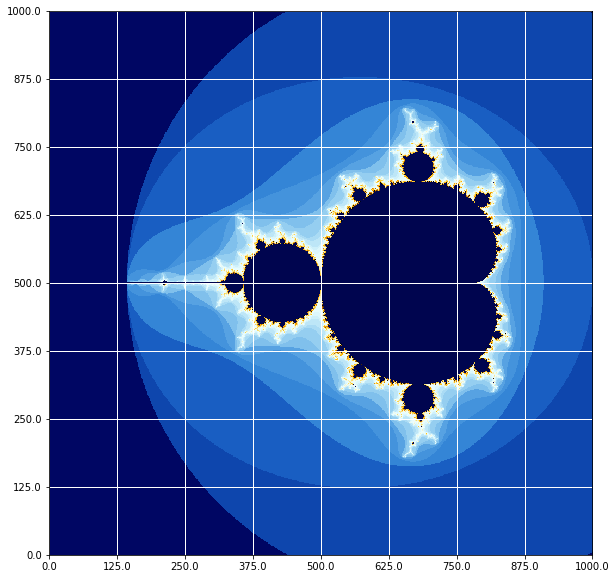

Time to completion (min):  0.7952388683954875


In [121]:
start_time = time.time()

# viewing window
x_min = Decimal(-2.5)
x_max = Decimal(1.0)
y_min = Decimal(-1.75)
y_max = Decimal(1.75)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_0',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

Now we need a helper function that can take the row and column values for the zoom and return the appropirate x and y ranges to serve as input to the other functions.

In [88]:
def compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid):
    x_min_old = Decimal(x_min)
    x_max_old = Decimal(x_max)
    y_min_old = Decimal(y_min)
    y_max_old = Decimal(y_max)
    
    x_slope = Decimal((x_max_old - x_min_old)/N_grid)
    y_slope = Decimal((y_max_old - y_min_old)/N_grid)
    
    x_min = x_min_old + Decimal(col_min)*x_slope
    x_max = x_min_old + Decimal(col_max)*x_slope
    y_min = y_min_old + Decimal(row_min)*y_slope
    y_max = y_min_old + Decimal(row_max)*y_slope
    
    return x_min,x_max,y_min,y_max

Run it again but with row and column values for a zoomed-in view:

The coordinate at the center of the view is: (-0.9687500 + 0.2187500j)


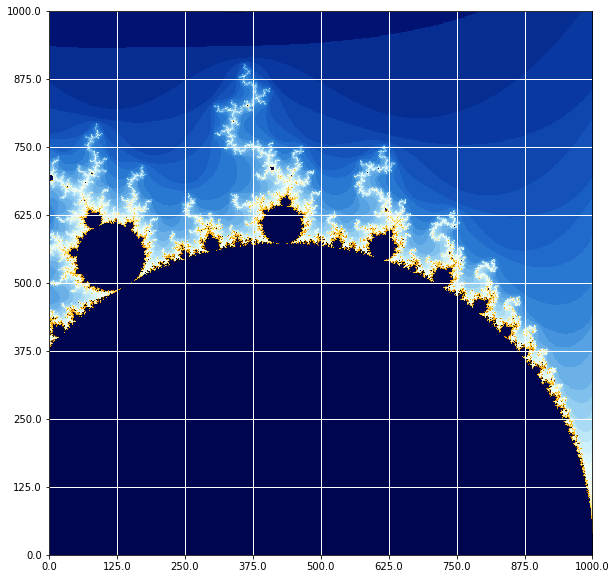

Time to completion (min):  1.5009530345598856


In [89]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 375
col_max = 500
row_min = 500
row_max = 625

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_1',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

Repeat the process as many times as we like:

The coordinate at the center of the view is: (-0.804687500 + 0.218750000j)


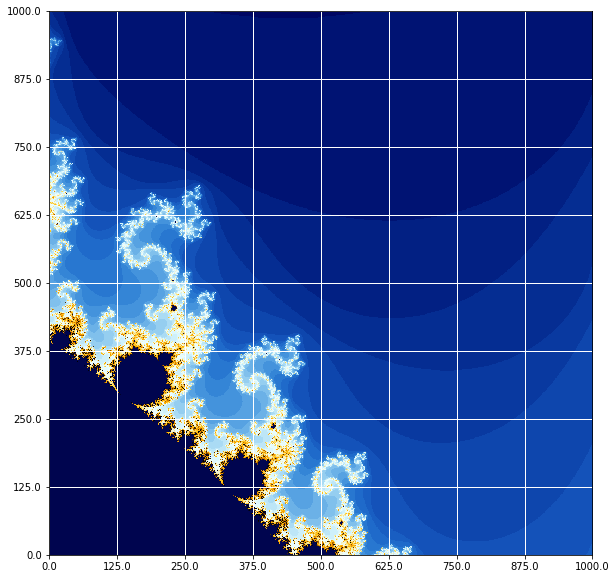

Time to completion (min):  1.7053954442342123


In [90]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 750
col_max = 1000
row_min = 375
row_max = 625

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_2',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.811523437500 + 0.198242187500j)


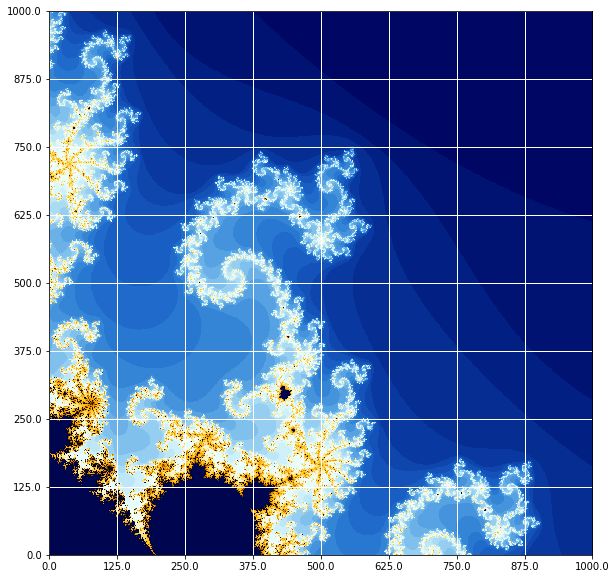

Time to completion (min):  2.7527682622273764


In [91]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 250
col_max = 625
row_min = 125
row_max = 500

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_3',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.8166503906250 + 0.1982421875000j)


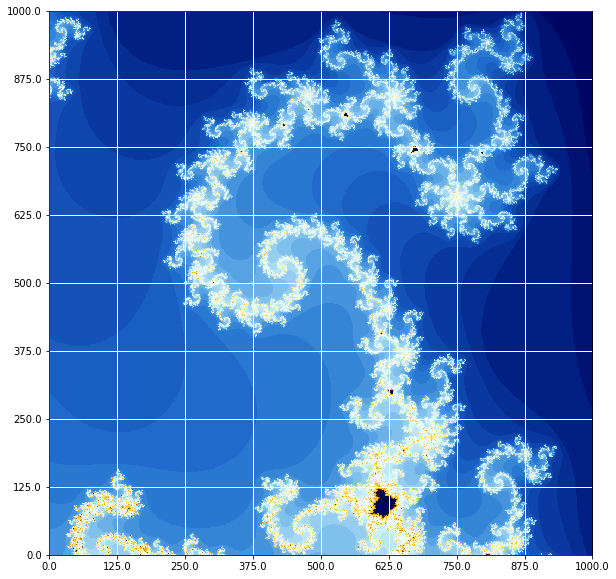

Time to completion (min):  1.6829801638921102


In [92]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 125
col_max = 625
row_min = 250
row_max = 750

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_4',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.8179321289062500 + 0.1995239257812500j)


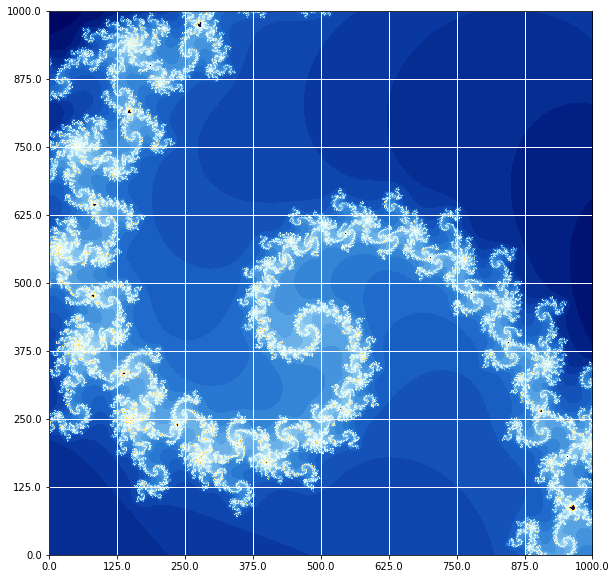

Time to completion (min):  2.007052206993103


In [93]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 250
col_max = 625
row_min = 375
row_max = 750

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_5',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.81793212890625000 + 0.19952392578125000j)


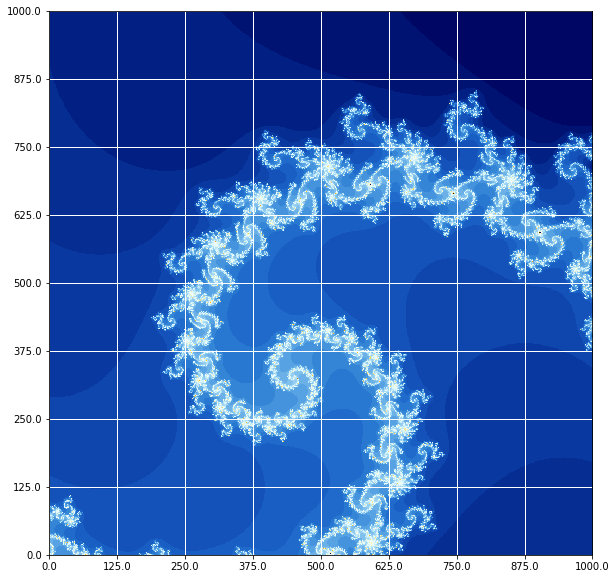

Time to completion (min):  2.1077308773994448


In [94]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 250
col_max = 750
row_min = 250
row_max = 750

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_6',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.81817245483398437500 + 0.19880294799804687500j)


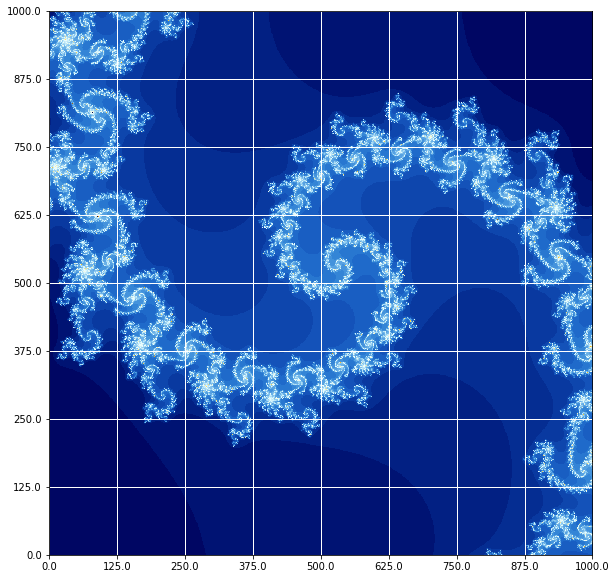

Time to completion (min):  2.670222826798757


In [95]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 250
col_max = 625
row_min = 125
row_max = 500

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_7',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.81808233261108398437500 + 0.19889307022094726562500j)


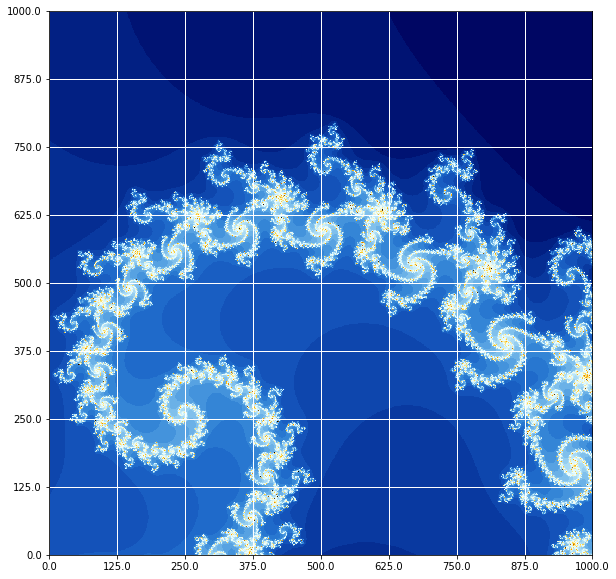

Time to completion (min):  3.3531977891922


In [96]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 500
col_max = 625
row_min = 500
row_max = 625

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_8',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.81804853677749633789062500 + 0.19890433549880981445312500j)


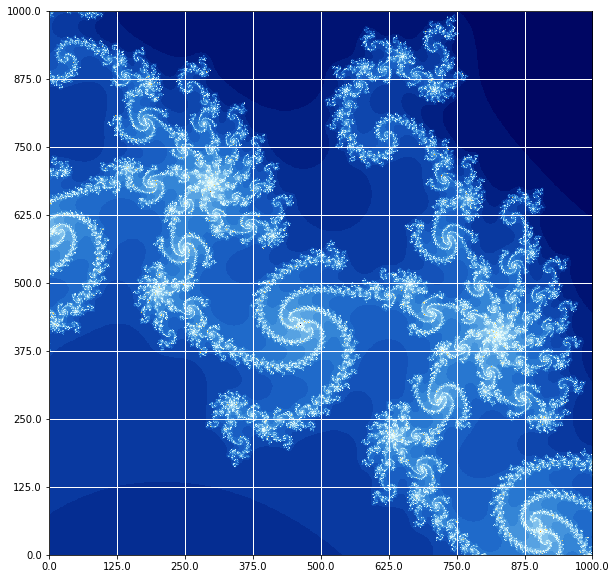

Time to completion (min):  3.8114476680755613


In [97]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 500
col_max = 875
row_min = 375
row_max = 750

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_9',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.81805276125669479370117187500 + 0.19890011101961135864257812500j)


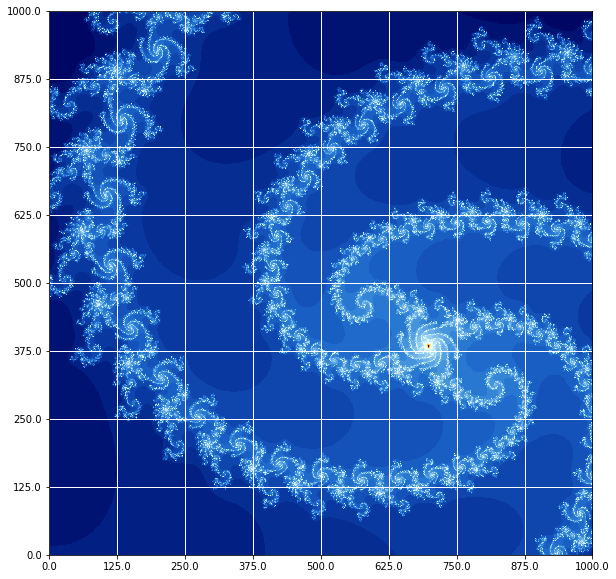

Time to completion (min):  4.987640341122945


In [98]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 375
col_max = 500
row_min = 375
row_max = 500

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_10',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.8180511813014745712280273437500 + 0.1988990548998117446899414062500j)


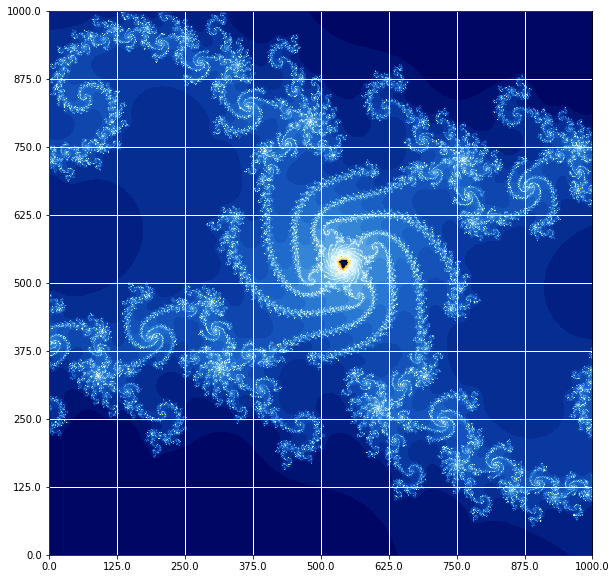

Time to completion (min):  5.988450686136882


In [99]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 562
col_max = 812
row_min = 250
row_max = 500

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_11',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.81805104928649961948394775390625 + 0.19889918691478669643402099609375j)


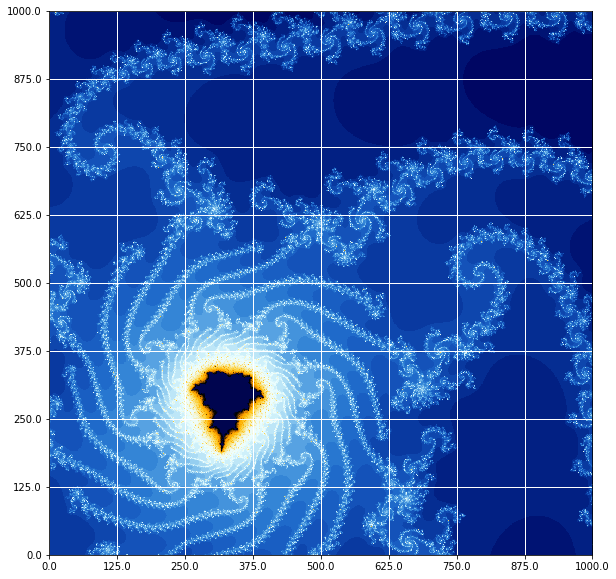

Time to completion (min):  8.874003763993581


In [100]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 500
col_max = 625
row_min = 500
row_max = 625

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_12',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.818051098792115226387977600097656 + 0.198899137409171089529991149902344j)


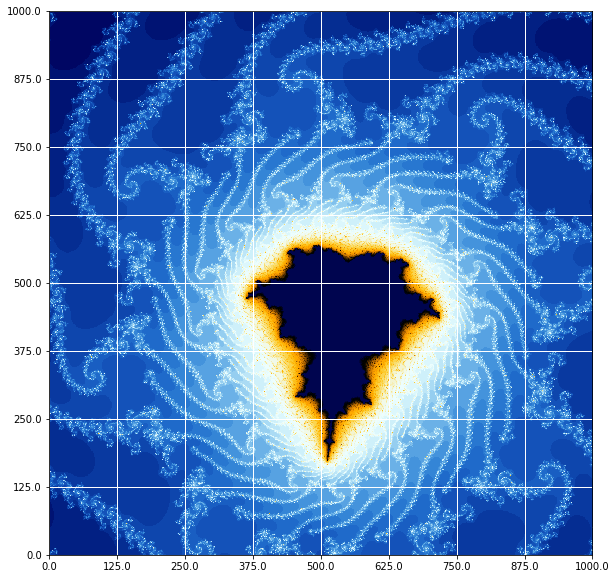

Time to completion (min):  13.2285178343455


In [101]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 125
col_max = 500
row_min = 125
row_max = 500

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_13',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.8180511111685191281139850616455075 + 0.1988991126563632860779762268066410j)


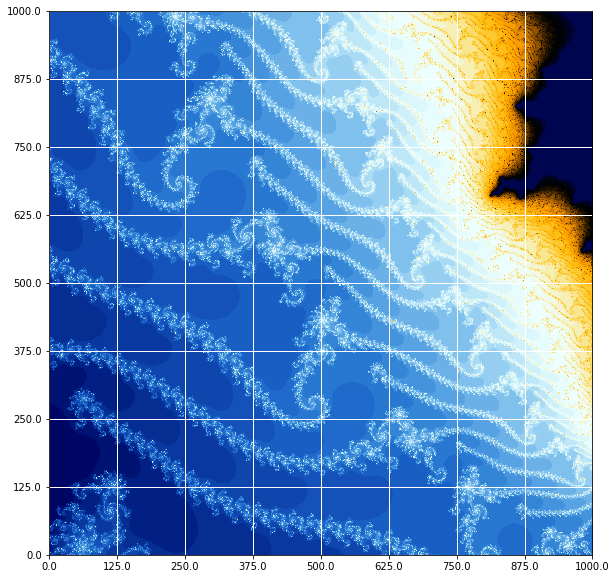

Time to completion (min):  14.957218384742736


In [102]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 250
col_max = 500
row_min = 125
row_max = 375

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_14',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.81805110652736766496673226356506319 + 0.19889911420341377379372715950012244j)


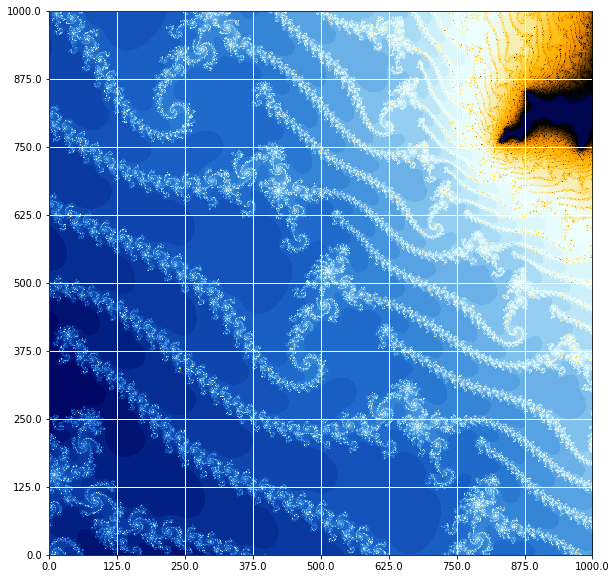

Time to completion (min):  16.367498954137165


In [103]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 500
col_max = 875
row_min = 375
row_max = 750

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_15',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.818051104206791933393105864524841035 + 0.198899116523989505367353558540344592j)


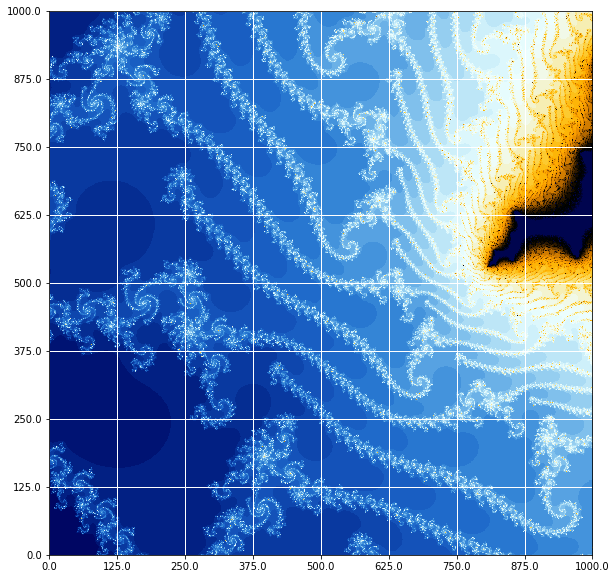

Time to completion (min):  20.281733306248984


In [104]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 625
col_max = 875
row_min = 625
row_max = 875

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_16',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.8180511039167199669464025646448132658 + 0.1988991168140614718140568584203723622j)


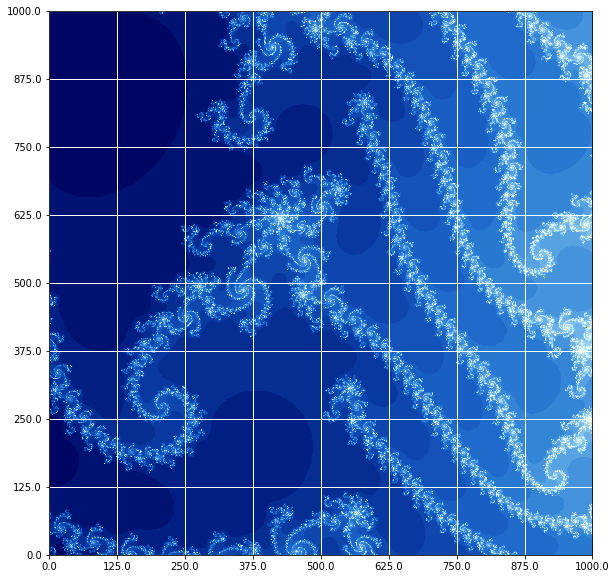

Time to completion (min):  20.989311544100442


In [105]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 500
col_max = 750
row_min = 500
row_max = 750

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_17',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.81805110395297896275224047712981673691 + 0.19889911685032046761989477090537583336j)


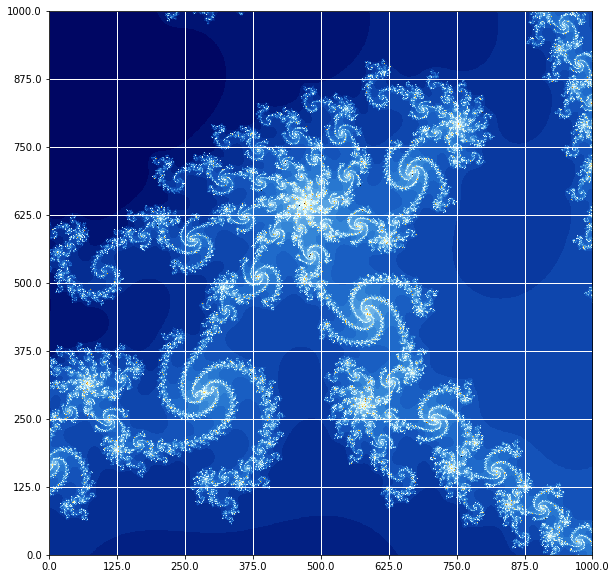

Time to completion (min):  25.463742184638978


In [106]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 250
col_max = 625
row_min = 375
row_max = 750

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_18',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.818051103952978962752240477129816736910 + 0.198899116877514714474273205269128436765j)


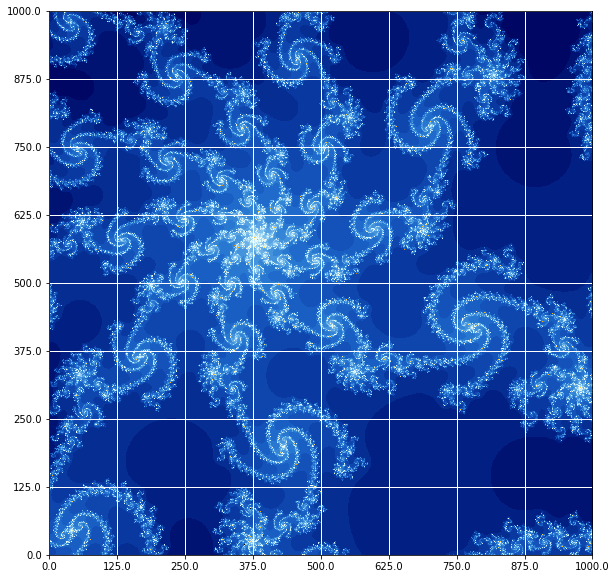

Time to completion (min):  28.188215561707814


In [107]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 375
col_max = 625
row_min = 500
row_max = 750

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_19',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.8180511039631768053226323900162239631730 + 0.1988991168809139953310705095645975121906j)


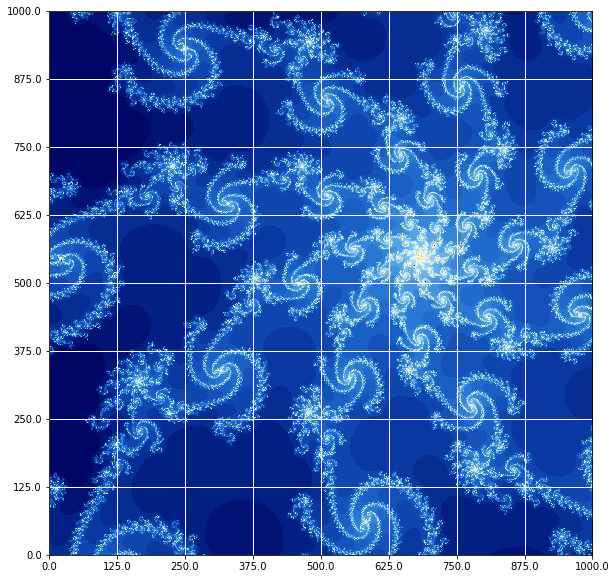

Time to completion (min):  28.051335235436756


In [108]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 125
col_max = 500
row_min = 375
row_max = 750

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_20',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.81805110395935261435873542268382125332438 + 0.19889911688218872565236949867539841547526j)


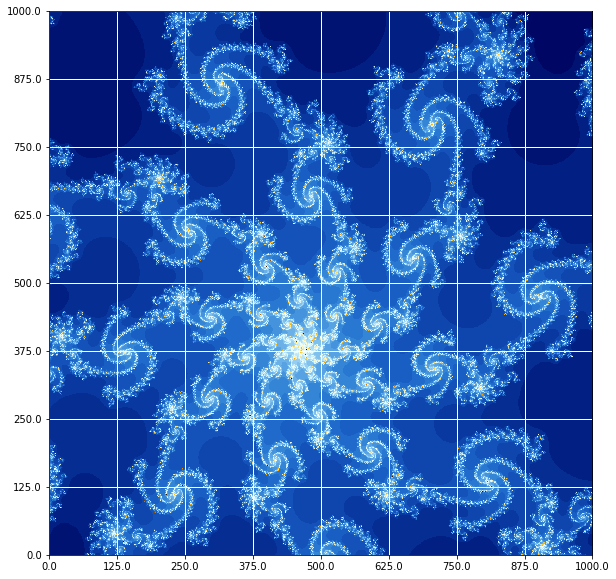

Time to completion (min):  30.892456297079722


In [109]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 625
col_max = 750
row_min = 500
row_max = 625

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_21',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.818051103959352614358735422683821253324375 + 0.198899116881870043072044751397698189654104j)


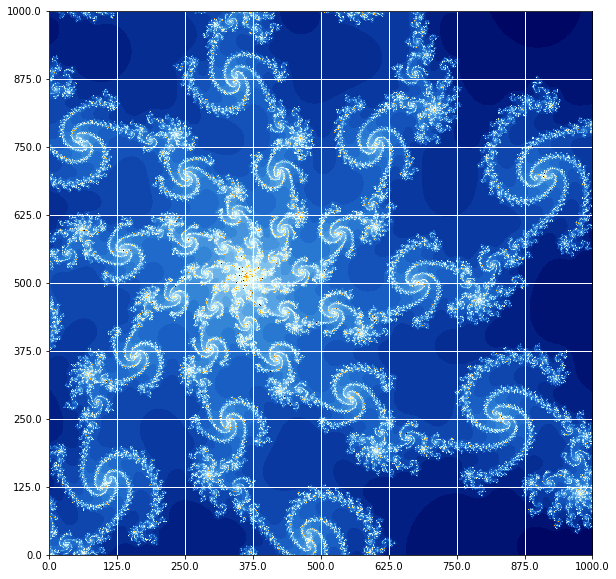

Time to completion (min):  32.0178498228391


In [110]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 375
col_max = 625
row_min = 250
row_max = 500

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_22',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.8180511039594322850038166095032463097795548 + 0.1988991168818700430720447513976981896541035j)


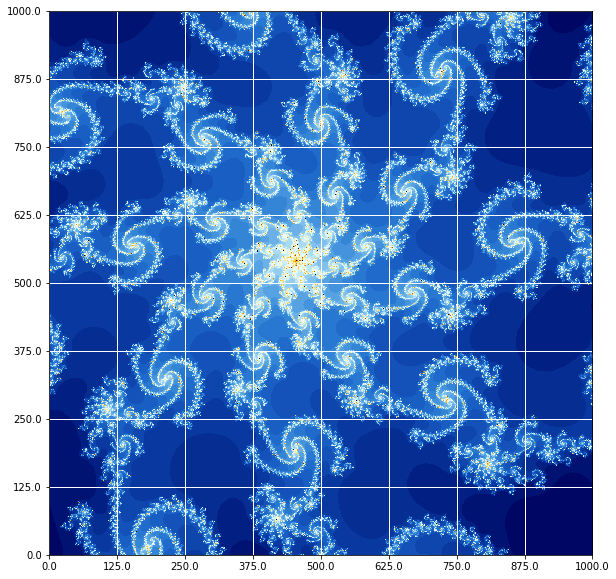

Time to completion (min):  33.23597587347031


In [111]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 250
col_max = 500
row_min = 375
row_max = 625

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_23',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.81805110395944224383445175785567444183645222 + 0.19889911688188000190267989975012632171101449j)


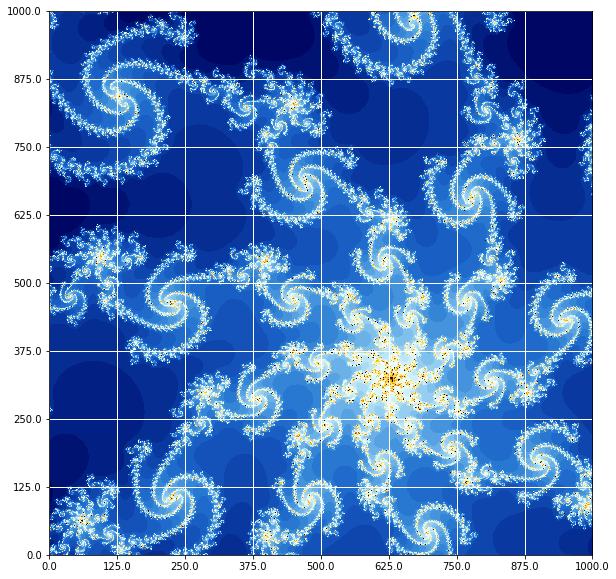

Time to completion (min):  35.53963535229365


In [112]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 375
col_max = 500
row_min = 500
row_max = 625

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_24',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.818051103959438509272963577223513892315115668 + 0.198899116881876267341191719117965772189672868j)


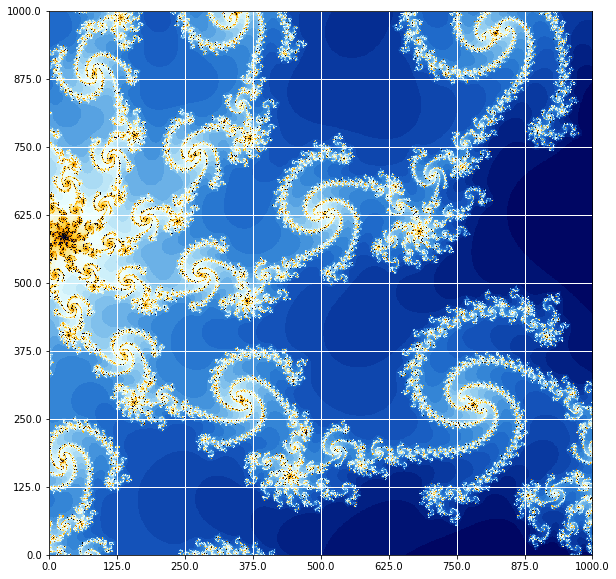

Time to completion (min):  38.00767887036006


In [113]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 625
col_max = 750
row_min = 250
row_max = 375

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_25',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.8180511039594395985200642965745607192588388290 + 0.1988991168818764229479203933109724617530621027j)


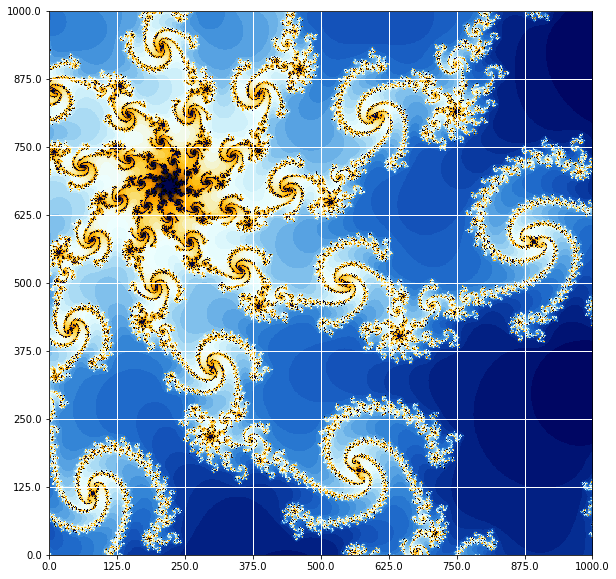

Time to completion (min):  40.44775392611822


In [114]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 0
col_max = 125
row_min = 500
row_max = 625

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_26',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.81805110395943969577426971794518990023595696839 + 0.19889911688187648130044364613334997033933306552j)


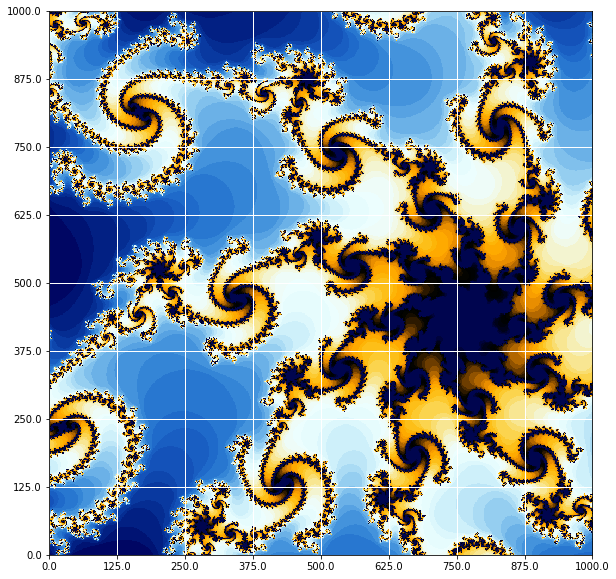

Time to completion (min):  42.49733687241872


In [115]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 125
col_max = 250
row_min = 625
row_max = 750

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_27',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

Out of curiosity, what is our current precision?

In [116]:
getcontext().prec

48

The coordinate at the center of the view is: (-0.818051103959439683617494040273861252613817200971 + 0.198899116881876478869088510599084240814905108741j)


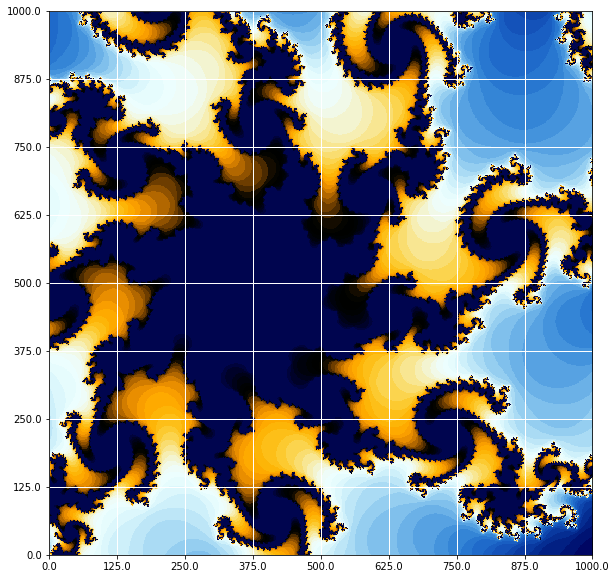

Time to completion (min):  43.950682719548546


In [117]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 625
col_max = 1000
row_min = 250
row_max = 625

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_28',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The coordinate at the center of the view is: (-0.8180511039594396854410103919245605497571381660838 + 0.1988991168818764788690885105990842408149051087410j)


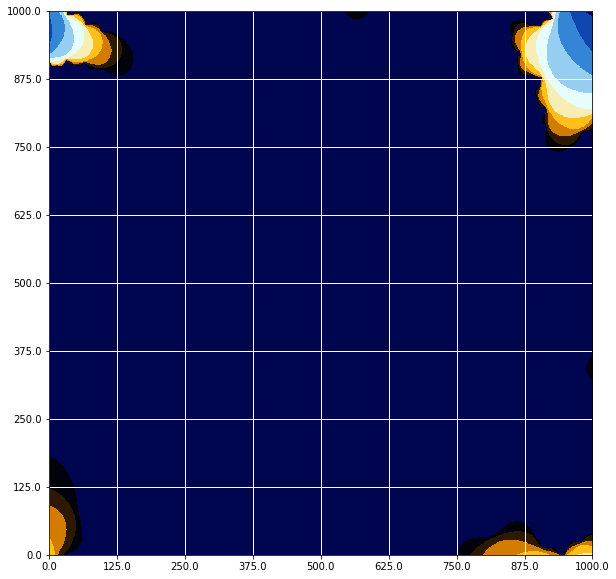

Time to completion (min):  44.364959088961285


In [118]:
start_time = time.time()

# new viewing window (square view only!)
# column & row to new x & y
col_min = 250
col_max = 500
row_min = 375
row_max = 625

x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50

Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Mset_29',Mset,num_color_levels) # image saved as png

show_image_2(N_grid,Mset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

Ok. I don't know why we don't have crisp resolution at this zoom level. hmmm... I'm also a bit bored with this and ready to move on to automating the proccess and creating a movie. The upside is we have the final coordinates to aim for when generating the movie. 

## Automating Image Generation

Things to think about:

If we do 15 or 30 frames per second then how many seconds do we want the movie/gif to be? That tells us how many frames we need and ultimately a guess at how long it will take to generate the images (assuming ~30min/image).

Lets say we want a 60 second movie at 15 frames per second that is 900 images. If it takes 30 min on average to render each image then the total render time is 27,000 min or 450 hours or 18.75 days! If each image is 300kb each then we have 270 mb of data which isn't too bad but the ~19 days to render is awful! If we work it backwards and say we want a render time of 2 days for all images then that means we have 96 images or a ~6.5 second movie at 15 frames per second (half that at 30 frames per second).

So, if we want 100 frames to take us from our initial view of x_min = -2.5, x_max = 1.0 to a final width of hmmmm I don't know I should have also printed that in addition to the center point. Not every step was the same zoom factor... but lets estimate it to get a rough idea. We took 29 zooms to get from the initial view to the final view. I would estimate that on average we zoomed-in on a 2x2 (=4) subimage at each step out of an 8x8 (=64) prior image for a fraction of 4/64 = 1/16 = 0.0625. or should we do it in terms of linear distance... so 2/8 = 1/4 = 0.25 of the distance in x and y each step. Our final linear size compared to the original would be $0.25^{29} = 3.5\times 10^{-18}$. So, if we want to get to this same zoom-factor with 100 images instead of 29 we would need:
$$N^{100} = 3.5\times10^{-18} \rightarrow 100 \log{N} = -18\log{3.5},$$
$$N = 10^{\frac{-18\log{3.5}}{100}} = 0.798 \approx 0.8$$
Okay, so 80 percent change in linear length at each step. In terms of what we have been doing with designating the min/max column and row number an 80 percent change in length would correspond to a min = 100 and a max = 900 for a 0 to 1000 linear grid size. 

Of course, we need to move the center of the view from (-0.75 + 0j) to the final position over the course of the frames or we just snap from the initial view to the zoomed-out positon and go from there or start farther out so that the center isn't that far off visually initially OR! start zoomed-out far enough and centered over the final destination? I think this last option is the best.

In [74]:
start_time = time.time()

# final view location
x_final = Decimal(-0.8180511039594396854747534490541574365918)
y_final = Decimal(0.1988991168818764788422807032252500524540)

# zoom_out value
zoom_out = Decimal(5)
# initial viewing window centered over final viewing location
x_min = Decimal(x_final) - zoom_out
x_max = Decimal(x_final) + zoom_out
y_min = Decimal(y_final) - zoom_out
y_max = Decimal(y_final) + zoom_out

# define parameters
getcontext().prec = 44 # same precision as our final coordinates
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50
file_name = '{:03d}_Mset' # using Python's string format functionality
N_images = 100

# do initial pass
print('The current image number is: ', 0)
Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)
save_image('000_Mset',Mset,num_color_levels) # image saved as png

# new viewing window (square view only!)
# column & row to new x & y
col_min = 100
col_max = 900
row_min = 100
row_max = 900

for i in range(1,N_images):
    print('The current image number is: ', i)
    x_min,x_max,y_min,y_max = compute_x_y_values(col_min,col_max,row_min,row_max,x_min,x_max,y_min,y_max,N_grid)
    Mset = generate_Mset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)
    save_image(file_name.format(i),Mset,num_color_levels) # image saved as png

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

The current image number is:  0
The coordinate at the center of the view is: (-0.81805110395943969603393952638725750148296356 + 0.19889911688187647542669367339840391650795937j)
The current image number is:  1
The coordinate at the center of the view is: (-0.81805110395943969603393952638725750148296356 + 0.19889911688187647542669367339840391650795937j)
The current image number is:  2
The coordinate at the center of the view is: (-0.81805110395943969603393952638725750148296356 + 0.19889911688187647542669367339840391650795937j)
The current image number is:  3
The coordinate at the center of the view is: (-0.81805110395943969603393952638725750148296356 + 0.19889911688187647542669367339840391650795937j)
The current image number is:  4
The coordinate at the center of the view is: (-0.81805110395943969603393952638725750148296356 + 0.19889911688187647542669367339840391650795937j)
The current image number is:  5
The coordinate at the center of the view is: (-0.8180511039594396960339395263872575

The current image number is:  47
The coordinate at the center of the view is: (-0.8180511039594396960339395263872575014829635600000 + 0.1988991168818764754266936733984039165079593700000j)
The current image number is:  48
The coordinate at the center of the view is: (-0.81805110395943969603393952638725750148296356000000 + 0.19889911688187647542669367339840391650795937000000j)
The current image number is:  49
The coordinate at the center of the view is: (-0.818051103959439696033939526387257501482963560000000 + 0.198899116881876475426693673398403916507959370000000j)
The current image number is:  50
The coordinate at the center of the view is: (-0.8180511039594396960339395263872575014829635600000000 + 0.1988991168818764754266936733984039165079593700000000j)
The current image number is:  51
The coordinate at the center of the view is: (-0.81805110395943969603393952638725750148296356000000000 + 0.19889911688187647542669367339840391650795937000000000j)
The current image number is:  52
The coo

The current image number is:  84
The coordinate at the center of the view is: (-0.81805110395943969603393952638725750148296356000000000000000000000000000000000000000000 + 0.19889911688187647542669367339840391650795937000000000000000000000000000000000000000000j)
The current image number is:  85
The coordinate at the center of the view is: (-0.818051103959439696033939526387257501482963560000000000000000000000000000000000000000000 + 0.198899116881876475426693673398403916507959370000000000000000000000000000000000000000000j)
The current image number is:  86
The coordinate at the center of the view is: (-0.8180511039594396960339395263872575014829635600000000000000000000000000000000000000000000 + 0.1988991168818764754266936733984039165079593700000000000000000000000000000000000000000000j)
The current image number is:  87
The coordinate at the center of the view is: (-0.81805110395943969603393952638725750148296356000000000000000000000000000000000000000000000 + 0.19889911688187647542669367339840

Whew. Those 100 images took 1226.4 minutes to generate or 20.4 hours! I made some wrong assumptions above because after those 100 80% zooms we are not at our final view. In the end I ran 125 more images and everything took about 6 days to run. We also seem to have gotten off our final destination towards the end. Ultimately I used 207 images for a zoom factor of:

In [132]:
# linear zoom
print(800/1000)
print((800/1000)**207)

0.8
8.702164874310012e-21


## Movie Generation

Our code saves the images sequentially so it is fairly straightforward to make use of [FFmpeg](https://ffmpeg.org/) to weave the images into an mp4. I didn't try to add audio. This [link](https://stackoverflow.com/questions/24102336/how-can-i-place-a-still-image-before-the-first-frame-of-a-video) was very helpful to create an intro slide to the video and this [link](https://hamelot.io/visualization/using-ffmpeg-to-convert-a-set-of-images-into-a-video/) was helpful to create the video from the still images. I used 3 frames per second so my 207 frames resulted in a movie that is a little over a minute long.

Here's the resulting video! Disappointingly, uploading the video to YouTube reduces the resolution to where it is fuzzy in places. 

In [136]:
from IPython.display import Video

Video("Mset_Deep_Zoom.mp4")

# Julia Sets

The Mandelbrot set is a special case of Julia sets which are generated by:
$$z_{n+1} = z_n^2 + C,$$
where $C$ is a complex constant and $z_0$ is the coordinate in the imaginary plane in question. I chose the value of $C$ from this [page](https://www.karlsims.com/julia.html#:~:text=Julia%20set%20fractals%20are%20normally,gives%20a%20specific%20Julia%20set). This is an easy change to the generating function:

In [81]:
def generate_Jset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max):
    r_max_squared = r_max**2
    scale_factor = (x_max - x_min) / (y_max - y_min)
    y_slope  = (y_max - y_min)/N_grid
    x_slope  = (x_max - x_min)/(scale_factor*N_grid)

    x_range = np.arange(int(scale_factor*N_grid))
    y_range = np.arange(N_grid)

    Jset = np.zeros((N_grid,int(scale_factor*N_grid))) # np.zeros((num of rows, num of columns))

    for y in y_range:
        y_value = y_min + y_slope*y
        for x in x_range:
            x_value = x_min + x_slope*x
            # test 
            n = 0
            z_0_re = Decimal(x_value)
            z_0_im = Decimal(y_value)
            C_re = Decimal(-0.79)
            C_im = Decimal(0.15)
            # Mandelbrot generator: z_(n+1) = z_n**2 + C
            z_re = z_0_re**2 - z_0_im**2 + C_re
            z_im = Decimal(2)*z_0_re * z_0_im + C_im
            z_test_mag_squared = z_re**2 + z_im**2
            while z_test_mag_squared <= r_max_squared and n <= max_iteration:
                # Mandelbrot generator: z_(n+1) = z_n**2 + C
                z_re_new = z_re**2 - z_im**2 + C_re
                z_im_new = Decimal(2)*z_re * z_im + C_im
                z_test_mag_squared = z_re_new**2 + z_im_new**2
                n = n + 1
                # old becomes new again
                z_re = z_re_new
                z_im = z_im_new
            # update value in Mset
            Jset[y,x] = scaling_function(n)
    return Jset

Let's take a look!

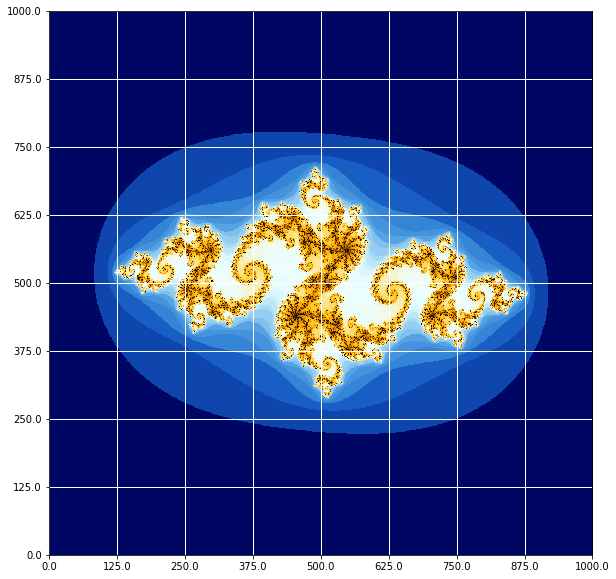

Time to completion (min):  0.5371134519577027


In [86]:
start_time = time.time()

# viewing window
x_min = Decimal(-2.0)
x_max = Decimal(2.0)
y_min = Decimal(-2.0)
y_max = Decimal(2.0)

# define parameters
max_iteration = 1000
r_max = 2
N_grid = 1000
num_color_levels = 50
getcontext().prec = 16

Jset = generate_Jset(x_min,x_max,y_min,y_max,N_grid,max_iteration,r_max)

save_image('Jset_0',Jset,num_color_levels) # image saved as png

show_image_2(N_grid,Jset,num_color_levels)

end_time = time.time()
print("Time to completion (min): ", (end_time - start_time) / 60)

## Wrapping Up

This has been fun and educational! We've learned how to create custom color maps and use them to display views of the Mandelbrot set and Julia sets. We also learned about the practical limitations of the numerical precision inherent in computations and a way around that with the decimal package. We've also learned how to use an external program to generate a movie from the saved frames. The above code could be streamlined and other deep dives and movies generated of the Mandelbrot set or Julia sets. This has also provided a bit of understanding into commercially available software like Ultra Fractal to better appreciate what it can do.